In [1]:
%cd ..

/pub/hofmann-scratch/glanzillo/mammoth


In [2]:

import numpy  # needed (don't change it)
import importlib
import os
import socket
import sys


path = os.path.abspath(os.path.join('.'))
print(path)
sys.path.append(path)
sys.path.append(path + '/models')
sys.path.append(path + '/continualdatasets')
sys.path.append(path + '/backbone')
sys.path.append(path + '/viz')

import datetime
import uuid
from argparse import ArgumentParser

import setproctitle
import torch
from models import get_all_models, get_model
from continualdatasets import NAMES as DATASET_NAMES
from continualdatasets import ContinualDataset, get_dataset

from utils.args import add_management_args
from utils.best_args import best_args
from utils.conf import set_random_seed, WANDBKEY
from utils.continual_training import train as ctrain
from utils.distributed import make_dp
from utils.training import train


/pub/hofmann-scratch/glanzillo/mammoth


/local/home/glanzillo/.local/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/local/home/glanzillo/.local/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c104cuda9SetDeviceEi'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [3]:
%ls logs/results

class-il/  domain-il/  task-il/


## We load all the results into dataframes

In [4]:
import json
import pandas as pd
import numpy as np

In [5]:
def read_logs(path):
    """Reads .txt logs file into pandas dataframe"""
    results = []
    with open(path) as f:
        while line := f.readline():
            results.append(json.loads(line))
    results = pd.DataFrame(results)
    return results

In [6]:
def merge_cilandtil(cil_df, til_df, T=5):
    columns = [f'accmean_task{t+1}' for t in range(T)] + \
      [f'accuracy_{i+1}_task{j+1}' for i in range(T) for j in range(T) if i<j] + \
      ['forward_transfer', 'backward_transfer',
       'forgetting','conf_jobnum']
    _merged = til_df.merge(cil_df[columns], how="inner", on=['conf_jobnum'],suffixes=("", "_cil"))
    return _merged
    

In [7]:
model = 'er'

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_til = read_logs(logs_path); 

_type = 'domain-il'
logs_path = f'./logs/results/{_type}/rot-mnist/{model}/logs.txt'
res_rm_er = read_logs(logs_path); 

res_c10_er = merge_cilandtil(res_cil, res_til)
res_c10_er['local'] = False
res_rm_er['local'] = False


_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_til = read_logs(logs_path); 


res_timg_er = merge_cilandtil(res_cil, res_til, T=10)


res_rm_er.head(5)

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,all_updates_19_norm,parameters_19_norm,update_20_norm,all_updates_20_norm,parameters_20_norm,forward_transfer,backward_transfer,forgetting,n_parameters,local
0,[2],21,errmnist,0,0,False,0,0,0,0,...,0.364449,17.258339,0.022135,0.380638,17.258888,5.656316,6.320000,0.000000,89610,False
1,[3],33,errmnist,0,0,False,0,0,0,0,...,0.421228,17.212597,0.025252,0.438573,17.213474,11.341053,9.483684,0.001053,89610,False
2,[1],13,errmnist,0,0,True,0,0,0,0,...,0.401912,17.189579,0.023298,0.419454,17.190508,5.718947,8.532632,0.000000,89610,False
3,[0],11,errmnist,0,0,True,0,0,0,0,...,0.388390,17.144909,0.026403,0.410691,17.146324,8.812632,7.722632,0.000000,89610,False
4,[3],21,errmnist,0,0,False,0,0,0,0,...,3.174138,17.770342,0.203744,3.266129,17.797859,36.895789,9.023684,5.297895,89610,False


In [8]:
model = 'agem'

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_til = read_logs(logs_path); 

_type = 'domain-il'
logs_path = f'./logs/results/{_type}/rot-mnist/{model}/logs.txt'
res_rm_agem = read_logs(logs_path); 

res_c10_agem = merge_cilandtil(res_cil, res_til)
res_c10_agem['local'] = False
res_rm_agem['local'] = False

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_til = read_logs(logs_path); 


res_timg_agem = merge_cilandtil(res_cil, res_til, T=10)


res_timg_agem.head(5)

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,accuracy_6_task10_cil,accuracy_7_task8_cil,accuracy_7_task9_cil,accuracy_7_task10_cil,accuracy_8_task9_cil,accuracy_8_task10_cil,accuracy_9_task10_cil,forward_transfer_cil,backward_transfer_cil,forgetting_cil
0,[0],11,agemtinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.577778,-58.888889,58.888889
1,[1],11,agemtinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.577778,-71.211111,71.211111
2,[0],21,agemtinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.722222,-57.800000,57.800000
3,[1],21,agemtinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.722222,-70.077778,70.077778
4,[1],11,agemtinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.577778,-70.655556,70.655556


In [9]:
model = 'ewc_on'

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_til = read_logs(logs_path); 

_type = 'domain-il'
logs_path = f'./logs/results/{_type}/rot-mnist/{model}/logs.txt'
res_rm_ewc = read_logs(logs_path); 

res_c10_ewc_on= merge_cilandtil(res_cil, res_til)
res_c10_ewc_on['local'] = True
res_rm_ewc['local'] = True

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_til = read_logs(logs_path); 


res_timg_ewc = merge_cilandtil(res_cil, res_til, T=10)


res_timg_ewc.head(5)

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,accuracy_6_task10_cil,accuracy_7_task8_cil,accuracy_7_task9_cil,accuracy_7_task10_cil,accuracy_8_task9_cil,accuracy_8_task10_cil,accuracy_9_task10_cil,forward_transfer_cil,backward_transfer_cil,forgetting_cil
0,[1],13,ewctinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.411111,-46.811111,46.811111
1,[0],11,ewctinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.577778,-50.111111,50.111111
2,[2],21,ewctinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.722222,-46.611111,46.611111
3,[2],13,ewctinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.411111,-64.244444,64.244444
4,[3],21,ewctinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.722222,-64.655556,64.655556


In [10]:
model = 'icarl'

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_til = read_logs(logs_path); 

res_c10_icarl= merge_cilandtil(res_cil, res_til)
res_c10_icarl['local'] = True

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_til = read_logs(logs_path); 


res_timg_icarl = merge_cilandtil(res_cil, res_til, T=10)


res_timg_icarl.head(5)

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,accuracy_6_task10_cil,accuracy_7_task8_cil,accuracy_7_task9_cil,accuracy_7_task10_cil,accuracy_8_task9_cil,accuracy_8_task10_cil,accuracy_9_task10_cil,forward_transfer_cil,backward_transfer_cil,forgetting_cil
0,[3],33,icarltinyimg,0,0,False,0,0,0,0,...,3.5,1.9,1.6,0.9,4.5,4.3,0.9,None,-4.266667,4.333333
1,[3],33,icarltinyimg,0,0,False,0,0,0,0,...,3.5,1.9,1.6,0.9,4.5,4.3,0.9,None,-4.266667,4.333333
2,[3],33,icarltinyimg,0,0,False,0,0,0,0,...,3.5,1.9,1.6,0.9,4.5,4.3,0.9,None,-4.266667,4.333333
3,[3],33,icarltinyimg,0,0,False,0,0,0,0,...,3.5,1.9,1.6,0.9,4.5,4.3,0.9,None,-4.266667,4.333333
4,[0],11,icarltinyimg,0,0,False,0,0,0,0,...,2.2,1.0,1.7,1.2,2.4,2.3,1.8,None,-4.822222,4.833333


In [11]:
model = 'icarl_random'

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_til = read_logs(logs_path); 

res_c10_icarlrnd= merge_cilandtil(res_cil, res_til)
res_c10_icarlrnd['local'] = False
res_c10_icarlrnd = res_c10_icarlrnd.loc[res_c10_icarlrnd['notes']=="icarlrandomcifar10_v2"]

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_til = read_logs(logs_path); 


res_timg_icarlrnd = merge_cilandtil(res_cil, res_til, T=10)


res_timg_icarlrnd.head(5)

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,accuracy_6_task10_cil,accuracy_7_task8_cil,accuracy_7_task9_cil,accuracy_7_task10_cil,accuracy_8_task9_cil,accuracy_8_task10_cil,accuracy_9_task10_cil,forward_transfer_cil,backward_transfer_cil,forgetting_cil
0,[3],33,icarltinyimg,0,0,False,0,0,0,0,...,1.9,1.9,1.6,1.6,2.0,2.0,1.3,None,-4.888889,4.988889
1,[3],33,icarltinyimg,0,0,False,0,0,0,0,...,1.9,1.9,1.6,1.6,2.0,2.0,1.3,None,-4.888889,4.988889
2,[0],11,icarltinyimg,0,0,False,0,0,0,0,...,0.7,1.8,1.3,1.3,0.8,0.6,2.1,None,-4.455556,4.511111
3,[0],11,icarltinyimg,0,0,False,0,0,0,0,...,0.7,1.8,1.3,1.3,0.8,0.6,2.1,None,-4.455556,4.511111
4,[2],21,icarltinyimg,0,0,False,0,0,0,0,...,1.1,1.8,1.3,1.3,2.8,2.8,0.9,None,-5.455556,5.455556


In [12]:
model = 'ogd'

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_til = read_logs(logs_path); 

_type = 'domain-il'
logs_path = f'./logs/results/{_type}/rot-mnist/{model}/logs.txt'
res_rm_ogd = read_logs(logs_path); 

res_c10_ogd= merge_cilandtil(res_cil, res_til)
res_c10_ogd['local'] = True
res_rm_ogd['local'] = True
res_c10_ogd = res_c10_ogd.loc[res_c10_ogd['notes']=="ogdcifar10_norm"]

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_til = read_logs(logs_path); 


res_timg_ogd = merge_cilandtil(res_cil, res_til, T=10)


res_timg_ogd.head(5)

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,accuracy_6_task10_cil,accuracy_7_task8_cil,accuracy_7_task9_cil,accuracy_7_task10_cil,accuracy_8_task9_cil,accuracy_8_task10_cil,accuracy_9_task10_cil,forward_transfer_cil,backward_transfer_cil,forgetting_cil
0,[0],11,ogdtinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.577778,-49.566667,49.566667
1,[2],11,ogdtinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.577778,-74.644444,74.644444
2,[3],11,ogdtinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.577778,-75.244444,75.244444
3,[1],13,ogdtinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.411111,-47.277778,47.277778
4,[2],13,ogdtinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.411111,-63.966667,63.966667


In [13]:
model = 'pnn'

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_til = read_logs(logs_path); 

res_c10_pnn= merge_cilandtil(res_cil, res_til)
res_c10_pnn['local']=False
res_c10_pnn.head(5)

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,accuracy_2_task3_cil,accuracy_2_task4_cil,accuracy_2_task5_cil,accuracy_3_task4_cil,accuracy_3_task5_cil,accuracy_4_task5_cil,forward_transfer_cil,backward_transfer_cil,forgetting_cil,local
0,[0],11,pnncifar10,0,0,True,0,0,0,0,...,0,0,0,0,0,0,None,0.0,0.0,False
1,[3],33,pnncifar10,0,0,False,0,0,0,0,...,0,0,0,0,0,0,None,0.0,0.0,False
2,[2],21,pnncifar10,0,0,False,0,0,0,0,...,0,0,0,0,0,0,None,0.0,0.0,False
3,[1],13,pnncifar10,0,0,True,0,0,0,0,...,0,0,0,0,0,0,None,0.0,0.0,False
4,[2],13,pnncifar10,0,0,True,0,0,0,0,...,0,0,0,0,0,0,None,0.0,0.0,False


In [14]:
model = 'sgd'

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_til = read_logs(logs_path); 

_type = 'domain-il'
logs_path = f'./logs/results/{_type}/rot-mnist/{model}/logs.txt'
res_rm_sgd = read_logs(logs_path); 

res_c10_sgd= merge_cilandtil(res_cil, res_til)
res_c10_sgd['local'] = True
res_rm_sgd['local'] = True
res_c10_sgd.head(5)

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,accuracy_2_task3_cil,accuracy_2_task4_cil,accuracy_2_task5_cil,accuracy_3_task4_cil,accuracy_3_task5_cil,accuracy_4_task5_cil,forward_transfer_cil,backward_transfer_cil,forgetting_cil,local
0,[3],33,sgdcifar10,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,-13.2125,-89.4750,89.4750,True
1,[1],13,sgdcifar10,0,0,True,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,-12.4500,-89.0125,89.0125,True
2,[0],11,sgdcifar10,0,0,True,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,-12.4500,-89.2375,89.2375,True
3,[2],21,sgdcifar10,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,-11.7375,-88.4875,88.4875,True
4,[3],21,sgdcifar10,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,-11.7375,-94.3250,94.3250,True


In [15]:
model = 'si'

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-cifar10/{model}/logs.txt'
res_til = read_logs(logs_path); 

_type = 'domain-il'
logs_path = f'./logs/results/{_type}/rot-mnist/{model}/logs.txt'
res_rm_si = read_logs(logs_path); 

res_c10_si= merge_cilandtil(res_cil, res_til)
res_c10_si['local'] = True
res_rm_si['local'] = True

_type = 'class-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_cil = read_logs(logs_path); 

_type = 'task-il'
logs_path = f'./logs/results/{_type}/seq-tinyimg/{model}/logs.txt'
res_til = read_logs(logs_path); 


res_timg_si = merge_cilandtil(res_cil, res_til, T=10)


res_timg_si.head(5)

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,accuracy_6_task10_cil,accuracy_7_task8_cil,accuracy_7_task9_cil,accuracy_7_task10_cil,accuracy_8_task9_cil,accuracy_8_task10_cil,accuracy_9_task10_cil,forward_transfer_cil,backward_transfer_cil,forgetting_cil
0,[3],33,sitinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.666667,-56.311111,56.311111
1,[0],11,sitinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.577778,-58.100000,58.100000
2,[2],21,sitinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.722222,-58.655556,58.655556
3,[1],13,sitinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.411111,-56.900000,56.900000
4,[2],13,sitinyimg,0,0,False,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.411111,-67.777778,67.777778


In [16]:
all_rm_res = pd.concat([res_rm_sgd, res_rm_agem, res_rm_er, res_rm_ewc, res_rm_ogd, res_rm_si])
all_rm_res

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,forgetting,n_parameters,local,buffer_size,minibatch_size,e_lambda,gamma,mode,c,xi
0,[1],13.0,sgdrotmnist,0,0,False,0,0,0,0,...,0.006842,89610,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,[0],11.0,sgdrotmnist,0,0,False,0,0,0,0,...,0.121579,89610,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,[3],33.0,sgdrotmnist,0,0,False,0,0,0,0,...,0.122632,89610,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,[2],21.0,sgdrotmnist,0,0,False,0,0,0,0,...,0.025263,89610,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,[1],11.0,sgdrotmnist,0,0,False,0,0,0,0,...,8.177895,89610,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,[1],55.0,sirmnist_v2,0,0,False,0,0,0,0,...,14.583684,89610,True,NaN,NaN,NaN,NaN,NaN,1.0,1.0
65,[3],13.0,sirmnist_v2,0,0,False,0,0,0,0,...,10.698421,89610,True,NaN,NaN,NaN,NaN,NaN,1.0,1.0
66,[0],21.0,sirmnist_v2,0,0,False,0,0,0,0,...,9.858421,89610,True,NaN,NaN,NaN,NaN,NaN,1.0,1.0
67,[1],33.0,sirmnist_v2,0,0,False,0,0,0,0,...,5.388421,89610,True,NaN,NaN,NaN,NaN,NaN,1.0,1.0


In [17]:
all_c10_res = pd.concat([res_c10_si, res_c10_sgd, res_c10_pnn, res_c10_ogd, res_c10_icarlrnd, res_c10_icarl, res_c10_ewc_on, res_c10_agem, res_c10_er], ignore_index=True)
all_c10_res

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,forward_transfer_cil,backward_transfer_cil,forgetting_cil,local,softmax_temp,buffer_size,minibatch_size,mode,e_lambda,gamma
0,[1],13,sicifar10,0,0,True,0,0,0,0,...,-12.4500,-89.0750,89.0750,True,NaN,NaN,NaN,NaN,NaN,NaN
1,[2],21,sicifar10,0,0,False,0,0,0,0,...,-11.7500,-88.7625,88.7625,True,NaN,NaN,NaN,NaN,NaN,NaN
2,[3],33,sicifar10,0,0,False,0,0,0,0,...,-13.2125,-89.5000,89.5000,True,NaN,NaN,NaN,NaN,NaN,NaN
3,[0],11,sicifar10,0,0,True,0,0,0,0,...,-12.4500,-89.0125,89.0125,True,NaN,NaN,NaN,NaN,NaN,NaN
4,[3],21,sicifar10,0,0,False,0,0,0,0,...,-11.7500,-93.6500,93.6500,True,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,[3],33,ercifar10,0,0,False,0,0,0,0,...,-13.2125,-61.2500,61.2500,False,NaN,200.0,32.0,NaN,NaN,NaN
247,[2],21,ercifar10,0,0,False,0,0,0,0,...,-11.7500,-58.7375,58.7375,False,NaN,200.0,32.0,NaN,NaN,NaN
248,[1],13,ercifar10,0,0,True,0,0,0,0,...,-12.4500,-59.7000,59.7000,False,NaN,200.0,32.0,NaN,NaN,NaN
249,[0],11,ercifar10,0,0,True,0,0,0,0,...,-12.4500,-60.3875,60.3875,False,NaN,200.0,32.0,NaN,NaN,NaN


In [18]:
all_timg_res = pd.concat([res_timg_er, res_timg_icarlrnd, res_timg_icarl, res_timg_ewc, res_timg_agem, res_timg_si, res_timg_ogd], ignore_index=True)
all_timg_res

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,forward_transfer_cil,backward_transfer_cil,forgetting_cil,lr_decay,dropout,e_lambda,gamma,c,xi,mode
0,[2],21,ertinyimg,0,0,False,0,0,0,0,...,-0.722222,-49.755556,49.755556,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,[0],11,ertinyimg,0,0,False,0,0,0,0,...,-0.577778,-49.366667,49.366667,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,[1],13,ertinyimg,0,0,False,0,0,0,0,...,-0.411111,-48.666667,48.666667,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,[3],33,ertinyimg,0,0,False,0,0,0,0,...,-0.666667,-48.988889,48.988889,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,[0],11,ertinyimg,0,0,False,0,0,0,0,...,-0.577778,-72.711111,72.711111,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194,[3],33,ogdtinyimg,0,0,False,0,0,0,0,...,-0.666667,-73.577778,73.577778,NaN,NaN,NaN,NaN,NaN,NaN,gtl
195,[0],55,ogdtinyimg,0,0,False,0,0,0,0,...,-0.655556,-47.333333,47.333333,NaN,NaN,NaN,NaN,NaN,NaN,gtl
196,[2],55,ogdtinyimg,0,0,False,0,0,0,0,...,-0.655556,-73.822222,73.822222,NaN,NaN,NaN,NaN,NaN,NaN,gtl
197,[1],55,ogdtinyimg,0,0,False,0,0,0,0,...,-0.655556,-66.677778,66.677778,NaN,NaN,NaN,NaN,NaN,NaN,gtl


In [19]:
list(all_c10_res.columns)

['gpus_id',
 'seed',
 'notes',
 'non_verbose',
 'disable_log',
 'savecheckpoints',
 'validation',
 'ignore_other_metrics',
 'debug_mode',
 'nowand',
 'wandb_entity',
 'wandb_project',
 'wandb_name',
 'dataset',
 'model',
 'lr',
 'optim_wd',
 'optim_mom',
 'optim_nesterov',
 'n_epochs',
 'batch_size',
 'distributed',
 'c',
 'xi',
 'conf_jobnum',
 'conf_timestamp',
 'conf_host',
 'wandb_url',
 'accmean_task1',
 'accmean_task2',
 'accmean_task3',
 'accmean_task4',
 'accmean_task5',
 'accuracy_1_task1',
 'accuracy_1_task2',
 'accuracy_2_task2',
 'accuracy_1_task3',
 'accuracy_2_task3',
 'accuracy_3_task3',
 'accuracy_1_task4',
 'accuracy_2_task4',
 'accuracy_3_task4',
 'accuracy_4_task4',
 'accuracy_1_task5',
 'accuracy_2_task5',
 'accuracy_3_task5',
 'accuracy_4_task5',
 'accuracy_5_task5',
 'update_1_norm',
 'all_updates_1_norm',
 'parameters_1_norm',
 'update_2_norm',
 'all_updates_2_norm',
 'parameters_2_norm',
 'update_3_norm',
 'all_updates_3_norm',
 'parameters_3_norm',
 'update_4_n

## Local and global learning plots

In [20]:

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import AutoMinorLocator
from matplotlib.collections import LineCollection

In [21]:
def discretize_column(df, column_name, bins=10):
    _,b = pd.cut(df[column_name].astype(float), bins=bins, retbins=True)
    df[column_name+'_discrete'] = pd.cut(df[column_name].astype(float), bins=bins, labels=b[1:])
    return df

In [22]:
def process_dataframe(df):

    df['lr_cat']= df['lr'].astype('category')
    return df


In [23]:
def compute_forgetting_task(df, t):
    if t==1: 
        df[f'forgetting_task{t}']=0
        return df
    total = 0
    sum = 0
    for o in range(1,t):
        sum += - df[f'accuracy_{o}_task{t}'] + df[f'accuracy_{o}_task{o}']
        total+=1
    df[f'forgetting_task{t}'] = sum/total
    return df

In [24]:
def melt_by_task(df, tasks):
    all_tasks_df = []
    for t in range(1,tasks+1):
        columns = [f'accmean_task{t}',f'accmean_task{t}_cil','model','seed','notes','lr', 'buffer_size', f'forgetting_task{t}', f'update_{t}_norm']
        _df = pd.melt(df, id_vars=columns, value_vars=[f'all_updates_{t}_norm'])\
                    .rename(columns={f'accmean_task{t}':'accmean_til', f'accmean_task{t}_cil':'accmean_cil', 
                                     'value':'update_norm', f'forgetting_task{t}':'avg_forgetting',f'update_{t}_norm':'update_norm_task'})
        _df['task'] = t
        all_tasks_df.append(_df)
    return pd.concat(all_tasks_df, ignore_index=True)
    

In [25]:
def melt_by_task_dil(df, tasks):
    all_tasks_df = []
    for t in range(1,tasks+1):
        columns = [f'accmean_task{t}','model','seed','notes','lr','forgetting', 'buffer_size',f'update_{t}_norm']
        _df = pd.melt(df, id_vars=columns, value_vars=[f'all_updates_{t}_norm'])\
                    .rename(columns={f'accmean_task{t}':'accmean','value':'update_norm',f'update_{t}_norm':'update_norm_task'})
        _df['task'] = t
        all_tasks_df.append(_df)
    return pd.concat(all_tasks_df, ignore_index=True)
    

In [26]:
for t in range(1,6):
    all_c10_res = compute_forgetting_task(all_c10_res,t)

for t in range(1,11):
    all_timg_res = compute_forgetting_task(all_timg_res,t)

In [70]:
all_c10_res_melted = melt_by_task(all_c10_res, 5); all_c10_res_melted

,accmean_til,accmean_cil,model,seed,notes,lr,buffer_size,avg_forgetting,update_norm_task,variable,update_norm,task
0,92.60,92.60,si,13,sicifar10,0.0001,NaN,0.0000,0.748783,all_updates_1_norm,0.748783,1
1,92.25,92.25,si,21,sicifar10,0.0001,NaN,0.0000,0.756899,all_updates_1_norm,0.756899,1
2,93.55,93.55,si,33,sicifar10,0.0001,NaN,0.0000,0.741131,all_updates_1_norm,0.741131,1
3,92.30,92.30,si,11,sicifar10,0.0001,NaN,0.0000,0.741467,all_updates_1_norm,0.741467,1
4,96.05,96.05,si,21,sicifar10,0.0010,NaN,0.0000,1.902558,all_updates_1_norm,1.902558,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1250,90.77,47.76,er,33,ercifar10,0.1000,200.0,7.6000,9.580624,all_updates_5_norm,31.464373,5
1251,91.65,49.92,er,21,ercifar10,0.1000,200.0,6.7375,9.392972,all_updates_5_norm,31.802013,5
1252,91.61,48.99,er,13,ercifar10,0.1000,200.0,6.5500,9.443537,all_updates_5_norm,31.108616,5
1253,92.72,48.56,er,11,ercifar10,0.1000,200.0,5.3500,9.488072,all_updates_5_norm,31.172993,5


In [71]:
all_timg_res_melted = melt_by_task(all_timg_res, 10); all_timg_res_melted

,accmean_til,accmean_cil,model,seed,notes,lr,buffer_size,avg_forgetting,update_norm_task,variable,update_norm,task
0,49.20,49.20,er,21,ertinyimg,0.0001,500.0,0.000000,2.087910,all_updates_1_norm,2.087910,1
1,48.20,48.20,er,11,ertinyimg,0.0001,500.0,0.000000,2.093543,all_updates_1_norm,2.093543,1
2,48.30,48.30,er,13,ertinyimg,0.0001,500.0,0.000000,2.126289,all_updates_1_norm,2.126289,1
3,47.40,47.40,er,33,ertinyimg,0.0001,500.0,0.000000,2.095942,all_updates_1_norm,2.095942,1
4,75.30,75.30,er,11,ertinyimg,0.0100,500.0,0.000000,10.307089,all_updates_1_norm,10.307089,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1985,20.23,7.62,ogd,33,ogdtinyimg,0.1000,200.0,59.566667,28.852541,all_updates_10_norm,112.398102,10
1986,10.74,4.98,ogd,55,ogdtinyimg,0.0001,200.0,40.933333,2.463223,all_updates_10_norm,5.309566,10
1987,15.26,7.40,ogd,55,ogdtinyimg,0.0100,200.0,65.088889,9.455605,all_updates_10_norm,34.960125,10
1988,13.02,7.15,ogd,55,ogdtinyimg,0.0010,200.0,60.155556,4.810254,all_updates_10_norm,15.970318,10


In [72]:
all_rm_res_melted = melt_by_task_dil(all_rm_res, 20); all_rm_res_melted

,accmean,model,seed,notes,lr,forgetting,buffer_size,update_norm_task,variable,update_norm,task
0,8.8800,sgd,13.0,sgdrotmnist,0.0001,0.006842,NaN,0.036929,all_updates_1_norm,0.036929,1
1,17.7600,sgd,11.0,sgdrotmnist,0.0001,0.121579,NaN,0.030283,all_updates_1_norm,0.030283,1
2,14.2800,sgd,33.0,sgdrotmnist,0.0001,0.122632,NaN,0.039981,all_updates_1_norm,0.039981,1
3,11.3200,sgd,21.0,sgdrotmnist,0.0001,0.025263,NaN,0.032007,all_updates_1_norm,0.032007,1
4,39.2900,sgd,11.0,sgdrotmnist,0.0010,8.177895,NaN,0.297545,all_updates_1_norm,0.297545,1
...,...,...,...,...,...,...,...,...,...,...,...
8175,81.6205,si,55.0,sirmnist_v2,0.1000,14.583684,NaN,1.757732,all_updates_20_norm,15.540991,20
8176,10.0900,si,13.0,sirmnist_v2,1.0000,10.698421,NaN,0.088095,all_updates_20_norm,555.804871,20
8177,9.7400,si,21.0,sirmnist_v2,1.0000,9.858421,NaN,0.101029,all_updates_20_norm,808.626709,20
8178,9.6575,si,33.0,sirmnist_v2,1.0000,5.388421,NaN,251.397064,all_updates_20_norm,430.648712,20


/tmp/ipykernel_2560920/1806714630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lr_cat']= df['lr'].astype('category')
/tmp/ipykernel_2560920/2867911336.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


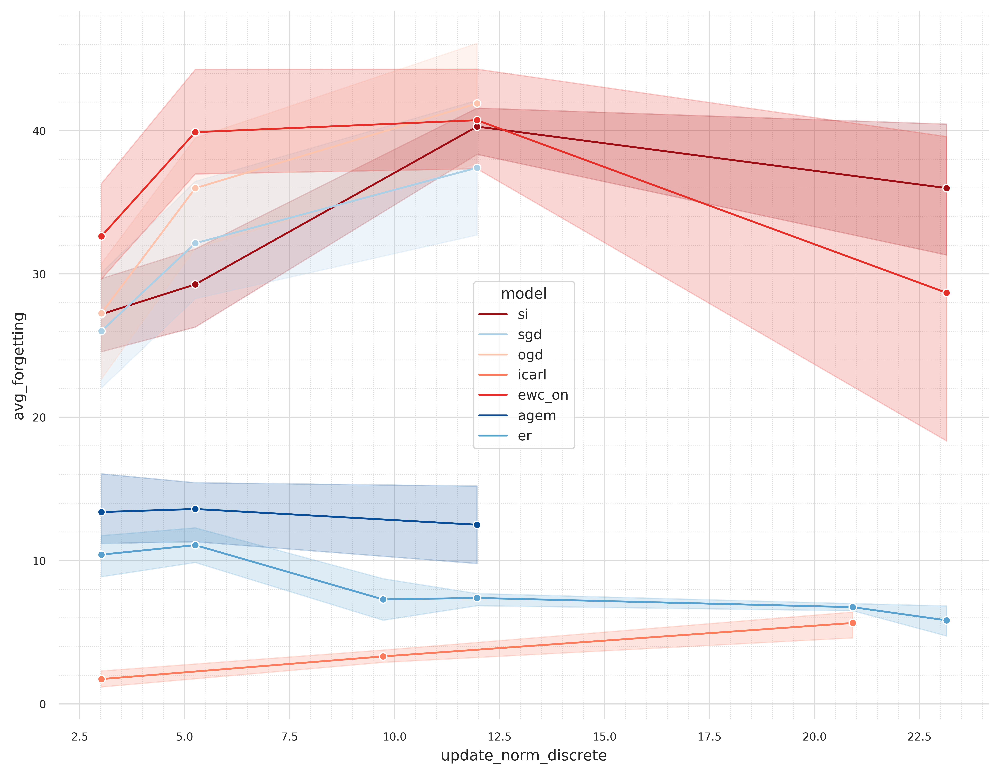

In [30]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,1, figsize=(9,7), sharey=False, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    
    
    colors1=sns.color_palette('Blues', n_colors=8); 
    colors2=sns.color_palette('Reds', n_colors=8); 

    my_palette={'ogd':colors2[1], 
                'icarl':colors2[3],
                'ewc_on':colors2[5],
                'si':colors2[7],
                'sgd':colors1[2],
                'er':colors1[4],
                'agem':colors1[7]}


    _df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']==5]
    _df = _df.loc[_df['update_norm']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)
    _df = _df.loc[_df['buffer_size'].isin([200,np.nan])]
    _df = _df.loc[_df['model'].isin(['ogd','icarl','ewc_on','si','er','agem','sgd'])]
    _df = discretize_column(_df, 'update_norm', bins=10)

    sns.lineplot(data=_df, x="update_norm_discrete", y="avg_forgetting", errorbar="ci", 
                 markers=True, marker='o', hue="model", palette=my_palette, ls='-',ax=ax)
    
    #ax[2].set_xscale('log')
    #ax.set_title(f"CIFAR100", fontsize=10, y=1.)
    #ax.set_ylabel(r'Test error', fontsize=10)
    #ax.set_xlabel(r'$\kappa$', fontsize=10, y=+1)
    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    [ax.spines[side].set_color('whitesmoke') for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.tick_params('both', labelsize=7)

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    
     # --------------------------------------------------------------------------
    # h, _ = ax.get_legend_handles_labels()
    # ax.get_legend().remove()


    # fig.legend([h[0],h[1],h[3],h[2],h[4]], [r'distillation ($\alpha=0.$)',
    #                r'$\alpha=0.25$',
    #                r'$\alpha=0.5$',
    #                r'$\alpha=0.75$',
    #                r'labels ($\alpha=1.$)'], ncols=1, 
    #            loc="center right") 

    
    #sns.despine()
    plt.tight_layout()


/tmp/ipykernel_2560920/1806714630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lr_cat']= df['lr'].astype('category')


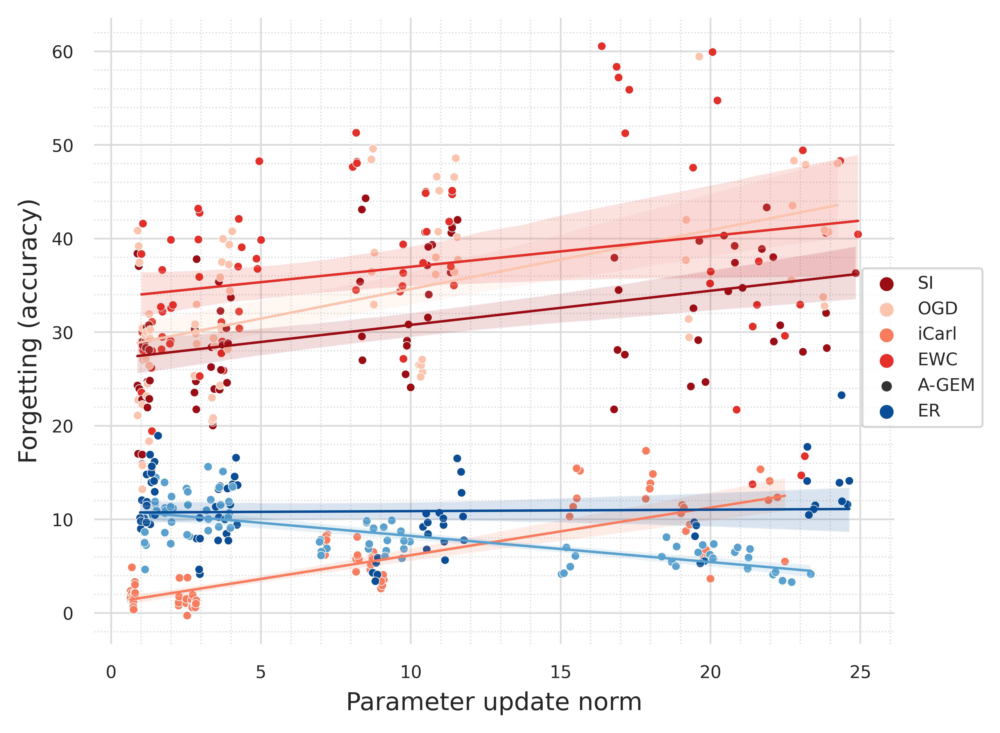

In [31]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,1, figsize=(5,4), sharey=False, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    

    colors1=sns.color_palette('Blues', n_colors=8); 
    colors2=sns.color_palette('Reds', n_colors=8); 

    my_palette={'ogd':colors2[1], 
                'icarl':colors2[3],
                'ewc_on':colors2[5],
                'si':colors2[7],
                'er':colors1[4],
                'agem':colors1[7]}


    _df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>1]
    _df = _df.loc[_df['update_norm']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)
    _df = _df.loc[_df['buffer_size'].isin([200,np.nan])]



    _dfl = _df.loc[_df['model'].isin(['ogd','icarl','ewc_on','si'])]
    sns.scatterplot(data=_dfl, x="update_norm", y="avg_forgetting", size=1,
                 markers=True, marker='o', hue="model", palette=my_palette, ls='-',ax=ax)
    

    _dfg = _df.loc[_df['model'].isin(['er','agem'])]
    sns.scatterplot(data=_dfg, x="update_norm", y="avg_forgetting", size=1,
                 markers=True, marker='o', hue="model", palette=my_palette, ls='-',ax=ax)
    
    for m in my_palette.keys():
        _dfr = _df.loc[_df['model']==m] # excluding test runs
        sns.regplot(data=_dfr, x="update_norm", y="avg_forgetting", ax=ax,  scatter=False,
                     label=m, color=my_palette[m], line_kws={'lw':1})
    
    
    ax.set_ylabel(r'Forgetting (accuracy)', fontsize=10)
    ax.set_xlabel(r'Parameter update norm', fontsize=10)
    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    [ax.spines[side].set_color('whitesmoke') for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.tick_params('both', labelsize=7)

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    
     # --------------------------------------------------------------------------
    h, l = ax.get_legend_handles_labels()
    ax.get_legend().remove()

    l = ['SI','OGD','iCarl', 'EWC', 'A-GEM', 'ER']
    lgd = fig.legend(h[:6], l, ncols=1, bbox_to_anchor=(1.1, 0.65), fontsize=7) 
    

    
    fig.savefig('Forgetting.pdf',bbox_extra_artists=(lgd,), bbox_inches='tight')


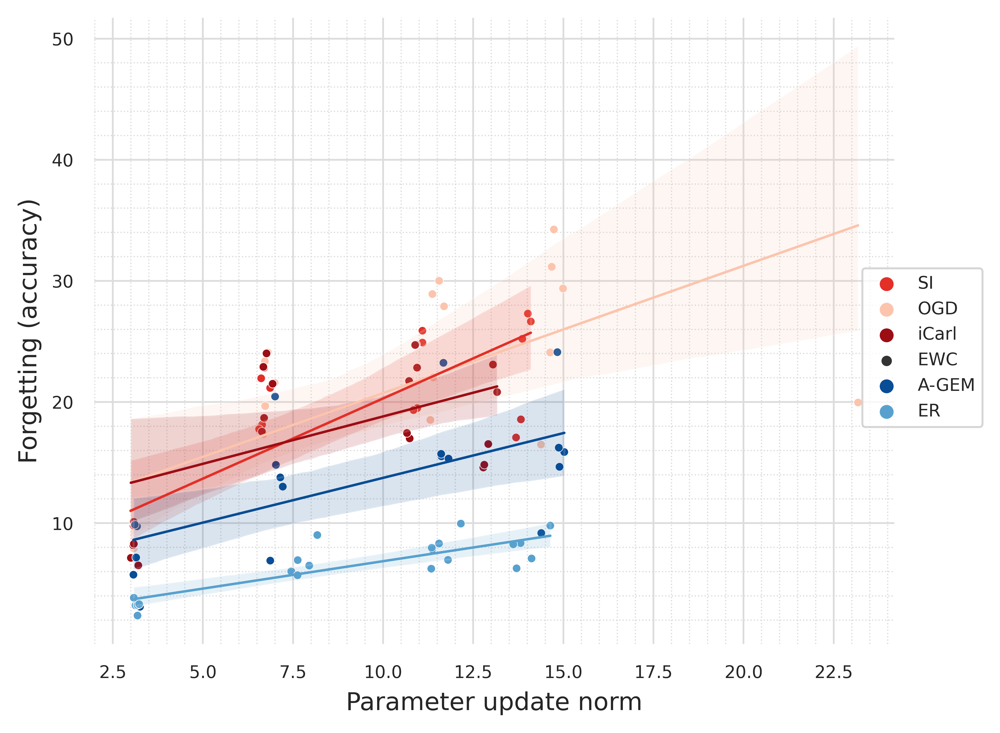

In [ ]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,1, figsize=(5,4), sharey=False, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    

    colors1=sns.color_palette('Blues', n_colors=8); 
    colors2=sns.color_palette('Reds', n_colors=8); 

    my_palette={'ogd':colors2[1], 
                'icarl':colors2[3],
                'ewc_on':colors2[5],
                'si':colors2[7],
                'er':colors1[4],
                'agem':colors1[7]}


    _df = all_rm_res_melted.loc[all_rm_res_melted['notes']!="testrun"] # excluding test runs
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']==20]
    _df = _df.loc[_df['lr']!=0.0001]
    #_df = _df.loc[_df['update_norm']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)
    _df = _df.loc[_df['buffer_size'].isin([500,np.nan])]



    _dfl = _df.loc[_df['model'].isin(['ogd','icarl','ewc_on','si'])]
    sns.scatterplot(data=_dfl, x="update_norm", y="forgetting", size=1,
                 markers=True, marker='o', hue="model", palette=my_palette, ls='-',ax=ax)
    

    _dfg = _df.loc[_df['model'].isin(['er','agem'])]
    sns.scatterplot(data=_dfg, x="update_norm", y="forgetting", size=1,
                 markers=True, marker='o', hue="model", palette=my_palette, ls='-',ax=ax)
    
    for m in my_palette.keys():
        _dfr = _df.loc[_df['model']==m] # excluding test runs
        sns.regplot(data=_dfr, x="update_norm", y="forgetting", ax=ax,  scatter=False,
                     label=m, color=my_palette[m], line_kws={'lw':1})
    
    
    ax.set_ylabel(r'Forgetting (accuracy)', fontsize=10)
    ax.set_xlabel(r'Parameter update norm', fontsize=10)
    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    [ax.spines[side].set_color('whitesmoke') for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.tick_params('both', labelsize=7)

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    
     # --------------------------------------------------------------------------
    h, l = ax.get_legend_handles_labels()
    ax.get_legend().remove()

    l = ['SI','OGD','iCarl', 'EWC', 'A-GEM', 'ER']
    lgd = fig.legend(h[:6], l, ncols=1, bbox_to_anchor=(1.1, 0.65), fontsize=7) 
    

    
    fig.savefig('Forgetting_rm.pdf',bbox_extra_artists=(lgd,), bbox_inches='tight')


/tmp/ipykernel_2822354/1806714630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lr_cat']= df['lr'].astype('category')


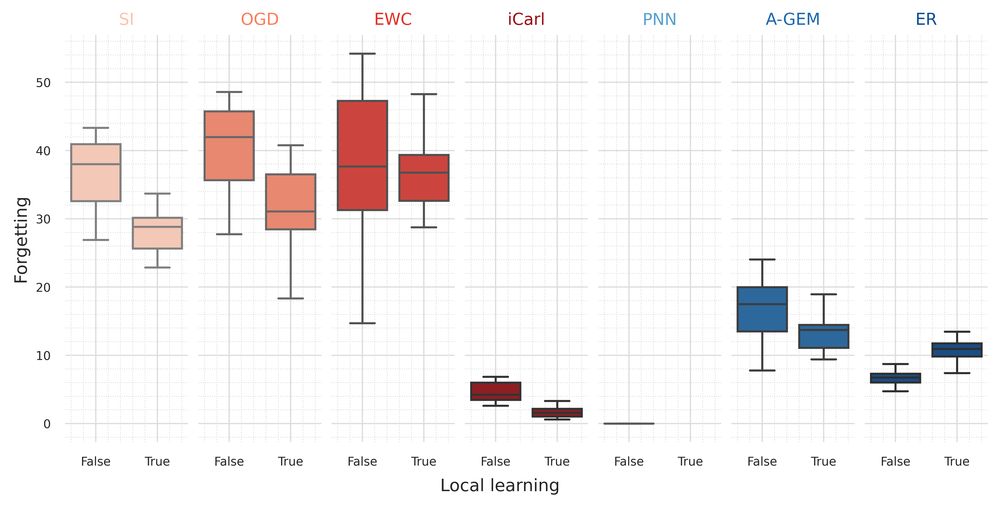

In [ ]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,7, figsize=(8,4), sharey=True, sharex=True, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    


    colors1=sns.color_palette('Blues', n_colors=8); 
    colors2=sns.color_palette('Reds', n_colors=8); 

    l = ['SI','OGD','EWC', 'iCarl', 'PNN','A-GEM', 'ER']

    my_palette={'si':colors2[1],
                'ogd':colors2[3], 
                'ewc_on':colors2[5],
                'icarl':colors2[7],
                'pnn':colors1[4],
                'agem':colors1[6],
                'er':colors1[7],}


    _df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']==5]
    _df['low_lr'] = _df['lr'] <= 0.001
    _df = _df.loc[_df['buffer_size'].isin([200,np.nan])]
    _df['low_lr'] = _df['update_norm'] <= 6
    #_df = _df.loc[_df['update_norm']<=25]

    for i,m in enumerate(my_palette.keys()):
        _dfr = _df.loc[_df['model']==m] # excluding test runs
        sns.boxplot(data=_dfr, x='low_lr', y="avg_forgetting", ax=ax[i],  color=my_palette[m])
    
        _ax = ax[i]
        _ax.set_title(l[i], color=my_palette[m])
        _ax.set_ylabel(r'', fontsize=10)
        _ax.set_xlabel(r'', fontsize=10)
        # AESTHETICS control 
        _ax.set_facecolor('white')
        [_ax.spines[side].set_visible(False) for side in _ax.spines]
        [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
        # major and minor grids
        _ax.grid(which='major', color='gainsboro', linewidth=0.7)
        _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
        # Make the minor ticks and gridlines show.
        _ax.minorticks_on()
        _ax.tick_params('both', labelsize=7)

    ax[0].set_ylabel(r'Forgetting', fontsize=10)
    fig.supxlabel(r'Local learning', fontsize=10)

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    
     # --------------------------------------------------------------------------
    # h, l = ax.get_legend_handles_labels()
    # ax.get_legend().remove()

    

    
    fig.savefig('Boxplot2.pdf',bbox_inches='tight')


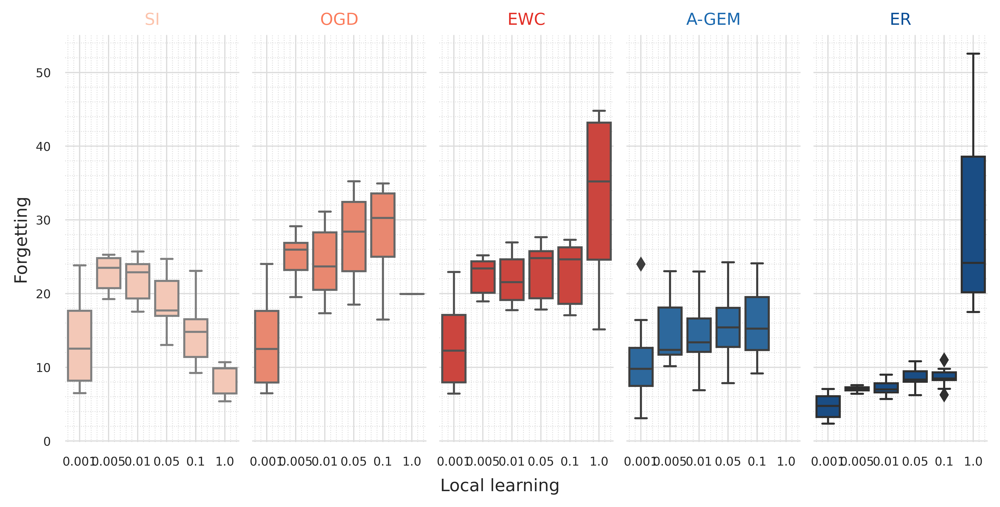

In [32]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,5, figsize=(8,4), sharey=True, sharex=True, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    


    colors1=sns.color_palette('Blues', n_colors=8); 
    colors2=sns.color_palette('Reds', n_colors=8); 

    l = ['SI','OGD','EWC','A-GEM', 'ER']

    my_palette={'si':colors2[1],
                'ogd':colors2[3], 
                'ewc_on':colors2[5],
                'agem':colors1[6],
                'er':colors1[7],}


    _df = all_rm_res.loc[all_rm_res['notes']!="testrun"] # excluding test runs
    _df = process_dataframe(_df)
    _df['low_lr'] = _df['lr'] <= 0.01
    _df['low_lr'] = _df['all_updates_20_norm'] <= 10
    _df = _df.loc[_df['lr']>0.0001]
    _df = _df.loc[_df['buffer_size'].isin([500,np.nan])]
    #_df = _df.loc[_df['update_norm']<=25]

    for i,m in enumerate(my_palette.keys()):
        _dfr = _df.loc[_df['model']==m] # excluding test runs
        sns.boxplot(data=_dfr, x='lr', y="forgetting", ax=ax[i],  color=my_palette[m])
    
        _ax = ax[i]
        _ax.set_title(l[i], color=my_palette[m])
        _ax.set_ylabel(r'', fontsize=10)
        _ax.set_xlabel(r'', fontsize=10)
        # AESTHETICS control 
        _ax.set_facecolor('white')
        [_ax.spines[side].set_visible(False) for side in _ax.spines]
        [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
        # major and minor grids
        _ax.grid(which='major', color='gainsboro', linewidth=0.7)
        _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
        # Make the minor ticks and gridlines show.
        _ax.minorticks_on()
        _ax.tick_params('both', labelsize=7)

    ax[0].set_ylabel(r'Forgetting', fontsize=10)
    fig.supxlabel(r'Local learning', fontsize=10)

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    
     # --------------------------------------------------------------------------
    # h, l = ax.get_legend_handles_labels()
    # ax.get_legend().remove()

    

    
    fig.savefig('Boxplot_rm.pdf',bbox_inches='tight')


In [33]:
_df = all_rm_res.loc[all_rm_res['notes']!="testrun"] # excluding test runs
_df = process_dataframe(_df)
#_df = _df.loc[_df['task']>1]
_df['low_lr'] = _df['lr'] <= 0.001
_df = _df.loc[_df['buffer_size'].isin([200,np.nan])]
_df.groupby(['lr','model','notes']).agg({'all_updates_20_norm':{'mean','std'}, 'forgetting':'mean'}).reset_index()

lr   model           notes all_updates_20_norm             forgetting
                                                  mean         std       mean
0   0.0001      er        errmnist            0.419383    0.026167   0.000211
1   0.0001  ewc_on       ewcrmnist            0.377389    0.015524   0.060737
2   0.0001  ewc_on    ewcrmnist_v2            1.978306    0.091022   2.751368
3   0.0001     sgd     sgdrotmnist            0.377454    0.015530   0.058526
4   0.0001     sgd  sgdrotmnist_v2            1.980948    0.091166   2.765158
5   0.0001      si        sirmnist            0.377453    0.015529   0.058737
6   0.0001      si     sirmnist_v2            1.980847    0.091166   2.764000
7   0.0010      er        errmnist            3.238247    0.043033   3.523053
8   0.0010  ewc_on       ewcrmnist            3.079088    0.074178   7.872842
9   0.0010  ewc_on    ewcrmnist_v2            5.331315    0.088953  17.710000
10  0.0010     sgd     sgdrotmnist            3.088256    0.074837   8.045789
11  0.0010     sgd  sgdrotmnist_v2            5.381389    0.096687  18.537368
12  0.0010      si        sirmnist            3.087859    0.074834   8.040947
13  0.0010      si     sirmnist_v2            5.372726    0.094850  18.373263
14  0.0050  ewc_on    ewcrmnist_v2            8.739506    0.116698  22.413053
15  0.0050     sgd  sgdrotmnist_v2            8.991694    0.118173  24.983895
16  0.0050      si     sirmnist_v2            8.795306    0.107806  22.723368
17  0.0100      er        errmnist            7.334222    0.199435   8.971789
18  0.0100  ewc_on       ewcrmnist            6.676482    0.116302  20.363895
19  0.0100  ewc_on    ewcrmnist_v2           10.657539    0.121557  23.278000
20  0.0100     sgd     sgdrotmnist            6.782655    0.125825  21.442947
21  0.0100     sgd  sgdrotmnist_v2           11.109336    0.108959  27.320947
22  0.0100      si        sirmnist            6.724074    0.098493  21.140789
23  0.0100      si     sirmnist_v2           10.537641    0.115539  22.515474
24  0.0500      er        errmnist           11.019068    0.258749  10.757053
25  0.0500  ewc_on       ewcrmnist           10.976895    0.110169  22.873474
26  0.0500  ewc_on    ewcrmnist_v2           16.472902    0.124614  23.144211
27  0.0500     sgd     sgdrotmnist           11.452143    0.124504  25.680000
28  0.0500     sgd  sgdrotmnist_v2           18.324979    0.136730  30.621579
29  0.0500      si        sirmnist           10.777844    0.111476  20.947763
30  0.0500      si     sirmnist_v2           13.885760    0.094428  15.633368
31  0.1000      er        errmnist           13.292109    0.315805  11.215474
32  0.1000  ewc_on       ewcrmnist           13.897247    0.162047  22.958211
33  0.1000  ewc_on    ewcrmnist_v2           20.397392    0.176598  22.708211
34  0.1000     sgd     sgdrotmnist           14.709344    0.189441  27.629263
35  0.1000     sgd   sgdrotmnist_5           23.613324    0.280931  30.967368
36  0.1000     sgd  sgdrotmnist_v2           23.613324    0.280931  30.967368
37  0.1000      si        sirmnist           12.935895    0.139113  18.036974
38  0.1000      si     sirmnist_v2           15.408923    0.174272  10.995368
39  1.0000  ewc_on    ewcrmnist_v2                 NaN         NaN  32.593684
40  1.0000      si     sirmnist_v2          509.498868  217.144255   8.454842

In [34]:
_df = all_c10_res.loc[all_c10_res['notes']!="testrun"] # excluding test runs
_df = process_dataframe(_df)
#_df = _df.loc[_df['task']>1]
_df['low_lr'] = _df['lr'] <= 0.001
_df = _df.loc[_df['buffer_size'].isin([200,np.nan])]
_df.groupby(['model','lr','notes']).agg({'accmean_task5':{'mean','std'}, 
                                         'all_updates_5_norm':{'mean','std'}, 
                                         'forgetting':{'mean','std'}}).reset_index()

/tmp/ipykernel_2560920/1806714630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lr_cat']= df['lr'].astype('category')
/tmp/ipykernel_2560920/1959146906.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['low_lr'] = _df['lr'] <= 0.001


model      lr                  notes accmean_task5            \
                                                         mean       std   
0           agem  0.0001            agemcifar10        78.560  2.586107   
1           agem  0.0010            agemcifar10        83.654  1.943471   
2           agem  0.0100            agemcifar10        86.446  2.662908   
3           agem  0.0500            agemcifar10        83.270  2.462661   
4           agem  0.1000            agemcifar10        80.358  1.948684   
5             er  0.0001              ercifar10        78.612  1.590368   
6             er  0.0010              ercifar10        84.974  1.461824   
7             er  0.0100              ercifar10        90.424  0.690674   
8             er  0.0500              ercifar10        91.980  0.927227   
9             er  0.1000              ercifar10        91.736  0.700414   
10        ewc_on  0.0001             ewccifar10        61.782  3.311551   
11        ewc_on  0.0010             ewccifar10        61.400  3.406839   
12        ewc_on  0.0100             ewccifar10        62.286  3.086030   
13        ewc_on  0.0500             ewccifar10        62.504  7.204348   
14        ewc_on  0.1000             ewccifar10        54.008  1.987881   
15         icarl  0.0001           icarlcifar10        78.924  0.679618   
16         icarl  0.0010           icarlcifar10        92.446  0.364115   
17         icarl  0.0100           icarlcifar10        93.464  0.551933   
18         icarl  0.0500           icarlcifar10        91.252  0.783690   
19         icarl  0.1000           icarlcifar10        89.764  0.996032   
20  icarl_random  0.0001  icarlrandomcifar10_v2        77.880  1.875153   
21  icarl_random  0.0010  icarlrandomcifar10_v2        92.140  0.464812   
22  icarl_random  0.0100  icarlrandomcifar10_v2        93.748  0.586916   
23  icarl_random  0.0500  icarlrandomcifar10_v2        92.938  0.999460   
24  icarl_random  0.1000  icarlrandomcifar10_v2        90.786  0.987335   
25           ogd  0.0001        ogdcifar10_norm        65.872  4.283727   
26           ogd  0.0010        ogdcifar10_norm        64.990  4.462354   
27           ogd  0.0100        ogdcifar10_norm        62.636  4.233855   
28           ogd  0.0500        ogdcifar10_norm        61.024  7.346995   
29           ogd  0.1000        ogdcifar10_norm        64.662  6.448587   
30           pnn  0.0001             pnncifar10        82.030  1.208615   
31           pnn  0.0010             pnncifar10        90.498  0.215917   
32           pnn  0.0100             pnncifar10        94.082  0.225322   
33           pnn  0.0500             pnncifar10        94.634  0.379381   
34           pnn  0.1000             pnncifar10        94.176  0.747482   
35           sgd  0.0001             sgdcifar10        69.234  4.317005   
36           sgd  0.0010             sgdcifar10        69.060  4.212113   
37           sgd  0.0100             sgdcifar10        66.538  4.951911   
38           sgd  0.0500             sgdcifar10        66.026  5.085418   
39           sgd  0.1000             sgdcifar10        69.894  3.051038   
40            si  0.0001              sicifar10        68.302  2.667540   
41            si  0.0010              sicifar10        71.026  3.053306   
42            si  0.0100              sicifar10        63.910  1.706737   
43            si  0.0500              sicifar10        66.660  4.773322   
44            si  0.1000              sicifar10        68.202  3.935959   

   all_updates_5_norm           forgetting             
                 mean       std       mean        std  
0            1.462892  0.062867    13.3875   3.480919  
1            4.152400  0.066588    13.5975   2.619032  
2           11.687610  0.086470    12.5000   3.535898  
3           26.016857  0.152126    16.9600   3.361401  
4           38.022334  1.112408    20.5500   2.496607  
5            2.013607  0.031396    10.4150   1.944351  
6            3.963076  0.057429    11

In [35]:
_df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
_df = process_dataframe(_df)
_df = _df.loc[_df['task']==5]
_df['low_lr'] = _df['lr'] <= 0.001
_df = _df.loc[_df['buffer_size'].isin([200,np.nan])]
_df.groupby(['model','low_lr','notes','task']).agg({'accmean_til':{'mean','std'}, 'avg_forgetting':{'mean','std'}}).reset_index()

/tmp/ipykernel_2560920/1806714630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lr_cat']= df['lr'].astype('category')


model low_lr                  notes task accmean_til            \
                                                           mean       std   
0           agem  False            agemcifar10    5   83.358000  3.386212   
1           agem   True            agemcifar10    5   81.107000  3.443709   
2             er  False              ercifar10    5   91.380000  1.011110   
3             er   True              ercifar10    5   81.793000  3.649238   
4         ewc_on  False             ewccifar10    5   59.599333  5.952808   
5         ewc_on   True             ewccifar10    5   61.591000  3.173790   
6          icarl  False           icarlcifar10    5   91.493333  1.738335   
7          icarl   True           icarlcifar10    5   85.685000  7.145232   
8   icarl_random  False  icarlrandomcifar10_v2    5   92.490667  1.528475   
9   icarl_random   True  icarlrandomcifar10_v2    5   85.010000  7.625236   
10           ogd  False        ogdcifar10_norm    5   62.774000  5.899049   
11           ogd   True        ogdcifar10_norm    5   65.431000  4.149920   
12           pnn  False             pnncifar10    5   94.297333  0.526843   
13           pnn   True             pnncifar10    5   86.264000  4.537462   
14           sgd  False             sgdcifar10    5   67.486000  4.495321   
15           sgd   True             sgdcifar10    5   69.147000  4.022015   
16            si  False              sicifar10    5   66.257333  3.891626   
17            si   True              sicifar10    5   69.664000  3.060578   

   avg_forgetting             
             mean        std  
0       16.670000   4.494247  
1       13.492500   2.906215  
2        6.675000   1.012191  
3       10.746250   1.746793  
4       37.658333  12.146432  
5       36.262500   5.830231  
6        4.668333   1.490115  
7        1.731250   0.931420  
8        2.195833   1.381855  
9        1.358750   2.198737  
10      40.156667   6.783572  
11      31.621250   6.709604  
12       0.000000   0.000000  
13       0.000000   0.000000  
14      36.607500   5.674486  
15      29.080000   5.848546  
16      36.675833   5.183999  
17      28.231250   3.274789

In [ ]:
list(all_timg_res.columns)

['gpus_id',
 'seed',
 'notes',
 'non_verbose',
 'disable_log',
 'savecheckpoints',
 'validation',
 'ignore_other_metrics',
 'debug_mode',
 'nowand',
 'wandb_entity',
 'wandb_project',
 'wandb_name',
 'dataset',
 'model',
 'lr',
 'optim_wd',
 'optim_mom',
 'optim_nesterov',
 'softmax_temp',
 'n_epochs',
 'batch_size',
 'distributed',
 'buffer_size',
 'minibatch_size',
 'conf_jobnum',
 'conf_timestamp',
 'conf_host',
 'wandb_url',
 'accmean_task1',
 'accmean_task2',
 'accmean_task3',
 'accmean_task4',
 'accmean_task5',
 'accmean_task6',
 'accmean_task7',
 'accmean_task8',
 'accmean_task9',
 'accmean_task10',
 'accuracy_1_task1',
 'accuracy_1_task2',
 'accuracy_2_task2',
 'accuracy_1_task3',
 'accuracy_2_task3',
 'accuracy_3_task3',
 'accuracy_1_task4',
 'accuracy_2_task4',
 'accuracy_3_task4',
 'accuracy_4_task4',
 'accuracy_1_task5',
 'accuracy_2_task5',
 'accuracy_3_task5',
 'accuracy_4_task5',
 'accuracy_5_task5',
 'accuracy_1_task6',
 'accuracy_2_task6',
 'accuracy_3_task6',
 'accura

In [36]:
all_timg_res

,gpus_id,seed,notes,non_verbose,disable_log,savecheckpoints,validation,ignore_other_metrics,debug_mode,nowand,...,forgetting_task1,forgetting_task2,forgetting_task3,forgetting_task4,forgetting_task5,forgetting_task6,forgetting_task7,forgetting_task8,forgetting_task9,forgetting_task10
0,[2],21,ertinyimg,0,0,False,0,0,0,0,...,0,8.3,8.90,11.433333,13.450,15.22,16.383333,17.957143,20.3125,20.766667
1,[0],11,ertinyimg,0,0,False,0,0,0,0,...,0,8.6,12.00,14.433333,13.625,15.72,17.250000,18.385714,18.3500,20.133333
2,[1],13,ertinyimg,0,0,False,0,0,0,0,...,0,6.2,8.25,10.933333,12.450,13.32,14.583333,17.071429,18.4250,19.033333
3,[3],33,ertinyimg,0,0,False,0,0,0,0,...,0,7.1,9.20,10.766667,12.450,13.82,15.350000,18.014286,18.1875,19.055556
4,[0],11,ertinyimg,0,0,False,0,0,0,0,...,0,16.8,21.10,27.133333,32.400,28.30,31.016667,31.742857,33.1875,35.511111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194,[3],33,ogdtinyimg,0,0,False,0,0,0,0,...,0,37.8,47.05,53.466667,53.025,54.10,58.400000,59.614286,59.6750,59.566667
195,[0],55,ogdtinyimg,0,0,False,0,0,0,0,...,0,24.8,28.85,32.800000,35.800,35.58,35.650000,38.500000,41.6250,40.933333
196,[2],55,ogdtinyimg,0,0,False,0,0,0,0,...,0,61.2,58.60,59.800000,59.525,61.26,62.183333,64.014286,64.0125,65.088889
197,[1],55,ogdtinyimg,0,0,False,0,0,0,0,...,0,50.5,54.70,54.933333,57.525,59.52,59.416667,60.271429,60.1375,60.155556


In [37]:
_df = all_timg_res.loc[all_timg_res['notes']!="testrun"] # excluding test runs
_df = process_dataframe(_df)
#_df = _df.loc[_df['task']>1]
_df['low_lr'] = _df['lr'] <= 0.001
_df = _df.loc[_df['buffer_size'].isin([500,200,np.nan])]
_df.groupby(['model','lr','notes','buffer_size']).agg({'accmean_task10':{'mean','std'}, 
                                         
                                         'backward_transfer':{'mean','std'}}).reset_index()

model      lr           notes buffer_size accmean_task10            \
                                                               mean       std   
0           agem  0.0001     agemtinyimg       500.0      24.655000  1.292296   
1           agem  0.0010     agemtinyimg       500.0      18.121667  0.784434   
2           agem  0.0100     agemtinyimg       500.0      24.636667  0.729543   
3           agem  0.0500     agemtinyimg       500.0      26.656667  0.087369   
4           agem  0.1000     agemtinyimg       500.0      29.120000  0.692965   
5             er  0.0001       ertinyimg       500.0      34.743750  0.435790   
6             er  0.0010       ertinyimg       500.0      30.580000  0.399500   
7             er  0.0100       ertinyimg       500.0      42.695000  0.721090   
8             er  0.0500       ertinyimg       500.0      50.781429  0.431564   
9             er  0.1000       ertinyimg       500.0      49.203333  0.520141   
10         icarl  0.0001    icarltinyimg       500.0      15.910000  1.068132   
11         icarl  0.0010    icarltinyimg       500.0      31.096923  0.596593   
12         icarl  0.0050    icarltinyimg       500.0      48.153333  0.411866   
13         icarl  0.0100    icarltinyimg       500.0      53.840000       NaN   
14         icarl  0.0100  icarltinyimg_2       500.0      54.186000  0.159154   
15         icarl  0.0500  icarltinyimg_2       500.0      59.446000  0.361012   
16         icarl  0.1000  icarltinyimg_2       500.0      59.928000  0.675589   
17  icarl_random  0.0001    icarltinyimg       500.0      11.520000  0.738609   
18  icarl_random  0.0010    icarltinyimg       500.0      20.724000  0.891206   
19  icarl_random  0.0100    icarltinyimg       500.0      40.042500  0.431501   
20  icarl_random  0.0500    icarltinyimg       500.0      48.616667  0.452755   
21  icarl_random  0.1000    icarltinyimg       500.0      50.544000  0.359068   
22           ogd  0.0001      ogdtinyimg       200.0      12.043333  1.970338   
23           ogd  0.0010      ogdtinyimg       200.0      12.450000  0.806102   
24           ogd  0.0100      ogdtinyimg       200.0      16.010000  0.670149   
25           ogd  0.0500      ogdtinyimg       200.0      17.453333  0.178979   
26           ogd  0.1000      ogdtinyimg       200.0      19.970000  1.112445   

   backward_transfer            
                mean       std  
0         -38.255556  1.217993  
1         -58.409259  0.834781  
2         -58.359259  0.361125  
3         -57.062963  1.021820  
4         -54.083333  0.903525  
5         -19.754167  0.660646  
6         -40.437037  0.308788  
7         -35.495833  0.656857  
8         -30.330159  0.645966  
9         -31.762963  0.609905  
10         -1.600000  0.656064  
11         -1.217094  0.249304  
12         -4.566667  0.384419  
13         -6.144444       NaN  
14         -6.064444  0.358012  
15        -11.713333  0.325785  
16        -13.755556  0.439346  
17         -2.636111  0.534811  
18         -5.497778  0.975176  
19        -12.722222  0.826757  
20        -18.418519  0.796556  
21        -23.451111  0.615770  
22        -40.822222  0.541944  
23        -59.288889  1.225652  
24        -64.837037  0.228071  
25        -64.007407  0.322094  
26        -59.558333  1.564981

/tmp/ipykernel_2560920/1806714630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lr_cat']= df['lr'].astype('category')


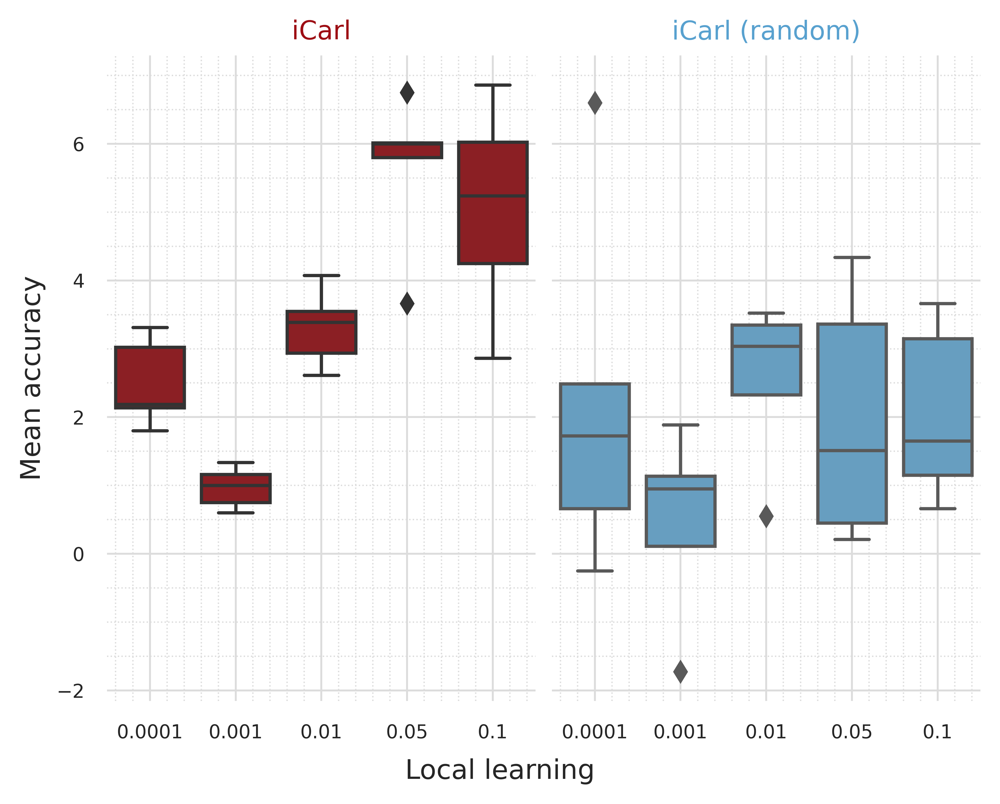

In [38]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,2, figsize=(5,4), sharey=True, sharex=True, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    


    colors1=sns.color_palette('Blues', n_colors=8); 
    colors2=sns.color_palette('Reds', n_colors=8); 

    l = ['iCarl', 'iCarl (random)']

    my_palette={
                'icarl':colors2[7],
                'icarl_random':colors1[4]
                }


    _df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>4]
    _df['low_lr'] = _df['lr'] <= 0.001
    #_df = _df.loc[_df['ta']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)

    for i,m in enumerate(my_palette.keys()):
        _dfr = _df.loc[_df['model']==m] # excluding test runs
        sns.boxplot(data=_dfr, x='lr', y="avg_forgetting", ax=ax[i],  color=my_palette[m], )
    
        _ax = ax[i]
        _ax.set_title(l[i], color=my_palette[m])
        _ax.set_ylabel(r'', fontsize=10)
        _ax.set_xlabel(r'', fontsize=10)
        # AESTHETICS control 
        _ax.set_facecolor('white')
        [_ax.spines[side].set_visible(False) for side in _ax.spines]
        [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
        # major and minor grids
        _ax.grid(which='major', color='gainsboro', linewidth=0.7)
        _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
        # Make the minor ticks and gridlines show.
        _ax.minorticks_on()
        _ax.tick_params('both', labelsize=7)

    ax[0].set_ylabel(r'Mean accuracy', fontsize=10)
    fig.supxlabel(r'Local learning', fontsize=10)

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    
     # --------------------------------------------------------------------------
    # h, l = ax.get_legend_handles_labels()
    # ax.get_legend().remove()

    

    
    fig.savefig('icarl.pdf',bbox_inches='tight')


/tmp/ipykernel_2560920/1806714630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lr_cat']= df['lr'].astype('category')


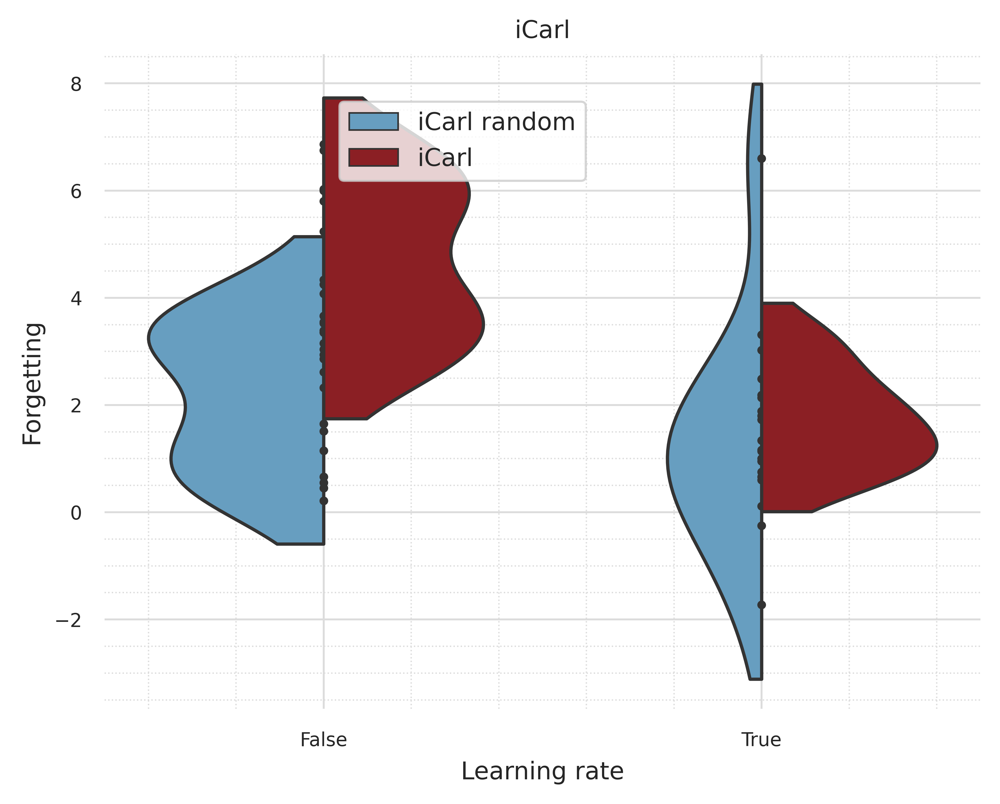

In [39]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(5,4), sharey=True, sharex=True, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    


    colors1=sns.color_palette('Blues', n_colors=8); 
    colors2=sns.color_palette('Reds', n_colors=8); 

    l = ['herding', 'random sampling']

    my_palette={
                'icarl':colors2[7],
                'icarl_random':colors1[4]
                }


    _df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>4]
    _df['low_lr'] = _df['lr'] <= 0.001
    #_df = _df.loc[_df['ta']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)

    _dfr = _df.loc[_df['model'].isin(['icarl','icarl_random'])] # excluding test runs
    sns.violinplot(data=_dfr, x='low_lr', y="avg_forgetting", ax=ax,  hue='model', cut=True, fill=False,
                   palette=my_palette, split=True, inner='point', inner_kws={'edgecolor':'white', 'marker':'*'})

    _ax = ax
    _ax.set_title('iCarl', fontsize=9)
    _ax.set_ylabel(r'', fontsize=10)
    _ax.set_xlabel(r'', fontsize=10)
    # AESTHETICS control 
    _ax.set_facecolor('white')
    [_ax.spines[side].set_visible(False) for side in _ax.spines]
    [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
    # major and minor grids
    _ax.grid(which='major', color='gainsboro', linewidth=0.7)
    _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    _ax.minorticks_on()
    _ax.tick_params('both', labelsize=7)

    ax.set_ylabel(r'Forgetting', fontsize=9)
    ax.set_xlabel(r'Learning rate', fontsize=9)

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    
     # --------------------------------------------------------------------------
    h, l = ax.get_legend_handles_labels()
    ax.get_legend().remove()

    lgd = fig.legend(h, ['iCarl random', 'iCarl'], ncols=1,
                      bbox_to_anchor=(0.6, 0.9), fontsize=9) 
    

    fig.savefig('icarl2.pdf',bbox_extra_artists=(lgd,), bbox_inches='tight')




In [47]:
all_c10_res_melted

,accmean_til,accmean_cil,model,seed,notes,lr,buffer_size,avg_forgetting,update_norm_task,variable,update_norm,task
0,92.60,92.60,si,13,sicifar10,0.0001,NaN,0.0000,0.748783,all_updates_1_norm,0.748783,1
1,92.25,92.25,si,21,sicifar10,0.0001,NaN,0.0000,0.756899,all_updates_1_norm,0.756899,1
2,93.55,93.55,si,33,sicifar10,0.0001,NaN,0.0000,0.741131,all_updates_1_norm,0.741131,1
3,92.30,92.30,si,11,sicifar10,0.0001,NaN,0.0000,0.741467,all_updates_1_norm,0.741467,1
4,96.05,96.05,si,21,sicifar10,0.0010,NaN,0.0000,1.902558,all_updates_1_norm,1.902558,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1250,90.77,47.76,er,33,ercifar10,0.1000,200.0,7.6000,9.580624,all_updates_5_norm,31.464373,5
1251,91.65,49.92,er,21,ercifar10,0.1000,200.0,6.7375,9.392972,all_updates_5_norm,31.802013,5
1252,91.61,48.99,er,13,ercifar10,0.1000,200.0,6.5500,9.443537,all_updates_5_norm,31.108616,5
1253,92.72,48.56,er,11,ercifar10,0.1000,200.0,5.3500,9.488072,all_updates_5_norm,31.172993,5


/tmp/ipykernel_2560920/1806714630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lr_cat']= df['lr'].astype('category')


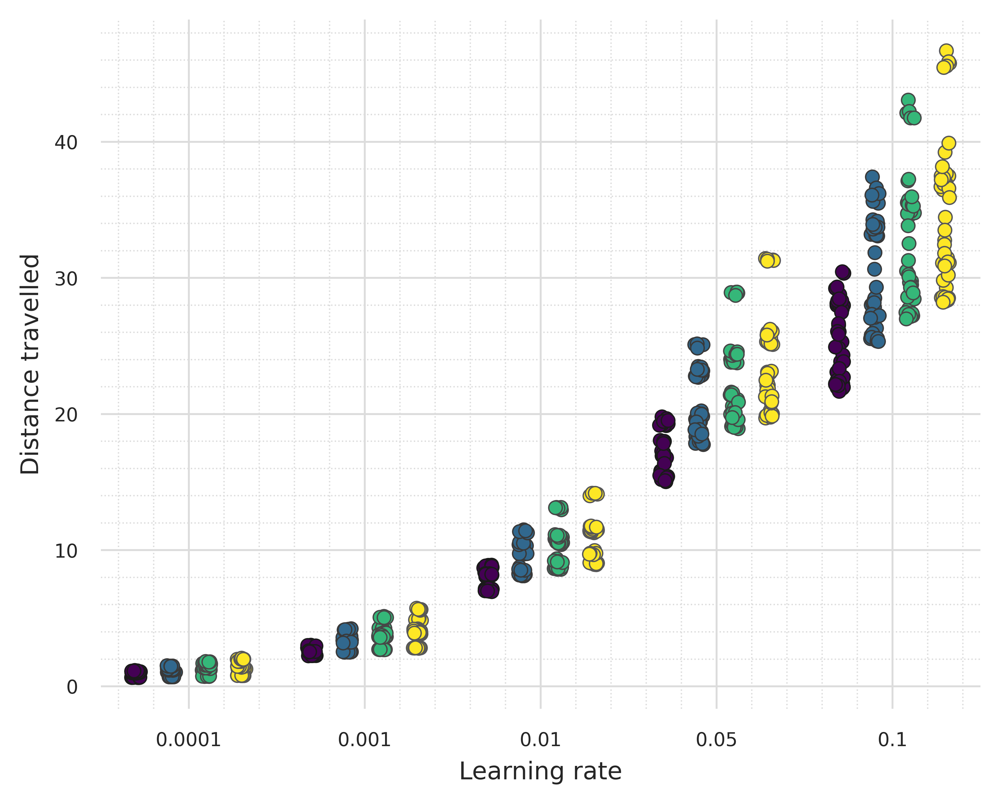

In [50]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(5,4), sharey=True, sharex=True, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    

    _df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>1]
    _df['low_lr'] = _df['lr'] <= 0.001
    #_df = _df.loc[_df['ta']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)

    #_dfr = _df.loc[_df['model'].isin(['icarl','icarl_random'])] # excluding test runs
    sns.stripplot(data=_df, x='lr', y="update_norm",hue='task', 
                  dodge=True, edgecolor="gray", linewidth=0.5, 
                  ax=ax, orient='v', palette="viridis")

    _ax = ax
    _ax.set_title('', fontsize=9)
    _ax.set_ylabel(r'', fontsize=10)
    _ax.set_xlabel(r'', fontsize=10)
    # AESTHETICS control 
    _ax.set_facecolor('white')
    [_ax.spines[side].set_visible(False) for side in _ax.spines]
    [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
    # major and minor grids
    _ax.grid(which='major', color='gainsboro', linewidth=0.7)
    _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    _ax.minorticks_on()
    _ax.tick_params('both', labelsize=7)

    ax.set_ylabel(r'Distance travelled', fontsize=9)
    ax.set_xlabel(r'Learning rate', fontsize=9)

    #ax.axhline(y=6, ls='--', color="orange")

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    
     # --------------------------------------------------------------------------
    h, l = ax.get_legend_handles_labels()
    ax.get_legend().remove()

    # lgd = fig.legend(h, ['1', '2', '3', '4' , '5'], ncols=5,
    #                   bbox_to_anchor=(0.9, -0.08), fontsize=9) 
    

    fig.savefig('updatenorm.pdf',#bbox_extra_artists=(lgd,), 
                bbox_inches='tight')




In [57]:
all_rm_res_melted.loc[all_rm_res_melted['update_norm']!=np.inf]

,accmean,model,seed,notes,lr,forgetting,buffer_size,update_norm_task,variable,update_norm,task
1505,9.80,ewc_on,13.0,ewcrmnist_v2,1.0,15.143684,NaN,inf,all_updates_4_norm,inf,4
1914,9.82,ewc_on,13.0,ewcrmnist_v2,1.0,15.143684,NaN,0.252595,all_updates_5_norm,inf,5
2323,11.35,ewc_on,13.0,ewcrmnist_v2,1.0,15.143684,NaN,3090.836914,all_updates_6_norm,inf,6
2732,10.09,ewc_on,13.0,ewcrmnist_v2,1.0,15.143684,NaN,0.232656,all_updates_7_norm,inf,7
3141,10.09,ewc_on,13.0,ewcrmnist_v2,1.0,15.143684,NaN,0.142980,all_updates_8_norm,inf,8
3550,10.09,ewc_on,13.0,ewcrmnist_v2,1.0,15.143684,NaN,0.297929,all_updates_9_norm,inf,9
3959,10.28,ewc_on,13.0,ewcrmnist_v2,1.0,15.143684,NaN,0.527074,all_updates_10_norm,inf,10
4368,10.28,ewc_on,13.0,ewcrmnist_v2,1.0,15.143684,NaN,0.155653,all_updates_11_norm,inf,11
4777,11.35,ewc_on,13.0,ewcrmnist_v2,1.0,15.143684,NaN,0.162365,all_updates_12_norm,inf,12
5186,9.58,ewc_on,13.0,ewcrmnist_v2,1.0,15.143684,NaN,0.193529,all_updates_13_norm,inf,13


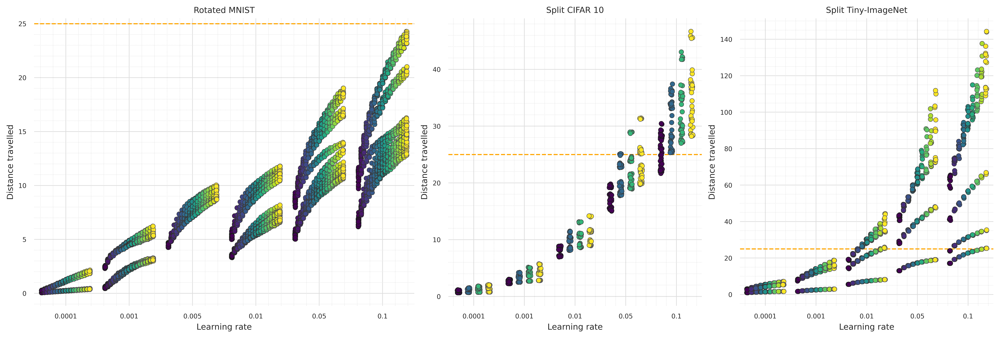

In [77]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,3, figsize=(15,5), sharey=False, width_ratios=[1.5,1,1],
                           sharex=False, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    

    _ax = ax[0]
    _df = all_rm_res_melted.loc[all_rm_res_melted['notes']!="testrun"] # excluding test runs
    _df = _df.loc[_df['update_norm']!=np.inf]
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>1]
    _df['low_lr'] = _df['lr'] <= 0.001
    _df = _df.loc[_df['lr']<=0.1]
    #_df = _df.loc[_df['ta']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)

    #_dfr = _df.loc[_df['model'].isin(['icarl','icarl_random'])] # excluding test runs
    sns.stripplot(data=_df, x='lr', y="update_norm",hue='task', 
                  dodge=True, edgecolor="gray", linewidth=0.5, 
                  ax=_ax, orient='v', palette="viridis")

    _ax.set_title('', fontsize=9)
    _ax.set_ylabel(r'', fontsize=10)
    _ax.set_xlabel(r'', fontsize=10)
    # AESTHETICS control 
    _ax.set_facecolor('white')
    [_ax.spines[side].set_visible(False) for side in _ax.spines]
    [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
    # major and minor grids
    _ax.grid(which='major', color='gainsboro', linewidth=0.7)
    _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    _ax.minorticks_on()
    _ax.tick_params('both', labelsize=7)

    _ax.set_ylabel(r'Distance travelled', fontsize=9)
    _ax.set_xlabel(r'Learning rate', fontsize=9)
    _ax.set_title(r'Rotated MNIST', fontsize=9)

    #ax.axhline(y=6, ls='--', color="orange")

    _ax.axhline(y=25, ls='--', color="orange")

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    h, l = _ax.get_legend_handles_labels()
    _ax.get_legend().remove()
    
     # --------------------------------------------------------------------------
    

    _ax = ax[1]
    _df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
    _df = _df.loc[_df['update_norm']!=np.inf]
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>1]
    _df['low_lr'] = _df['lr'] <= 0.001
    #_df = _df.loc[_df['ta']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)

    #_dfr = _df.loc[_df['model'].isin(['icarl','icarl_random'])] # excluding test runs
    sns.stripplot(data=_df, x='lr', y="update_norm",hue='task', 
                  dodge=True, edgecolor="gray", linewidth=0.5, 
                  ax=_ax, orient='v', palette="viridis")

    _ax.set_title('', fontsize=9)
    _ax.set_ylabel(r'', fontsize=10)
    _ax.set_xlabel(r'', fontsize=10)
    # AESTHETICS control 
    _ax.set_facecolor('white')
    [_ax.spines[side].set_visible(False) for side in _ax.spines]
    [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
    # major and minor grids
    _ax.grid(which='major', color='gainsboro', linewidth=0.7)
    _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    _ax.minorticks_on()
    _ax.tick_params('both', labelsize=7)

    _ax.set_ylabel(r'Distance travelled', fontsize=9)
    _ax.set_xlabel(r'Learning rate', fontsize=9)
    _ax.set_title(r'Split CIFAR 10', fontsize=9)

    #ax.axhline(y=6, ls='--', color="orange")


    _ax.axhline(y=25, ls='--', color="orange")
    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    h, l = _ax.get_legend_handles_labels()
    _ax.get_legend().remove()

    # --------------------------------------------------------------------------
    

    _ax = ax[2]
    _df = all_timg_res_melted.loc[all_timg_res_melted['notes']!="testrun"] # excluding test runs
    _df = _df.loc[_df['update_norm']!=np.inf]
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>1]
    _df = _df.loc[_df['lr']!=0.005]
    _df['low_lr'] = _df['lr'] <= 0.001
    #_df = _df.loc[_df['ta']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)

    #_dfr = _df.loc[_df['model'].isin(['icarl','icarl_random'])] # excluding test runs
    sns.stripplot(data=_df, x='lr', y="update_norm",hue='task', 
                  dodge=True, edgecolor="gray", linewidth=0.5, 
                  ax=_ax, orient='v', palette="viridis")

    _ax.set_title('', fontsize=9)
    _ax.set_ylabel(r'', fontsize=10)
    _ax.set_xlabel(r'', fontsize=10)
    # AESTHETICS control 
    _ax.set_facecolor('white')
    [_ax.spines[side].set_visible(False) for side in _ax.spines]
    [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
    # major and minor grids
    _ax.grid(which='major', color='gainsboro', linewidth=0.7)
    _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    _ax.minorticks_on()
    _ax.tick_params('both', labelsize=7)

    _ax.set_ylabel(r'Distance travelled', fontsize=9)
    _ax.set_xlabel(r'Learning rate', fontsize=9)
    _ax.set_title(r'Split Tiny-ImageNet', fontsize=9)

    _ax.axhline(y=25, ls='--', color="orange")

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    h, l = _ax.get_legend_handles_labels()
    _ax.get_legend().remove()
    
    # --------------------------------------------------------------------------

    # lgd = fig.legend(h, ['1', '2', '3', '4' , '5'], ncols=5,
    #                   bbox_to_anchor=(0.9, -0.08), fontsize=9) 
    

    fig.savefig('updatenorm.pdf',#bbox_extra_artists=(lgd,), 
                bbox_inches='tight')




/local/home/glanzillo/.local/lib/python3.10/site-packages/seaborn/categorical.py:3025: UserWarning: catplot is a figure-level function and does not accept target axes. You may wish to try stripplot
  warnings.warn(msg, UserWarning)


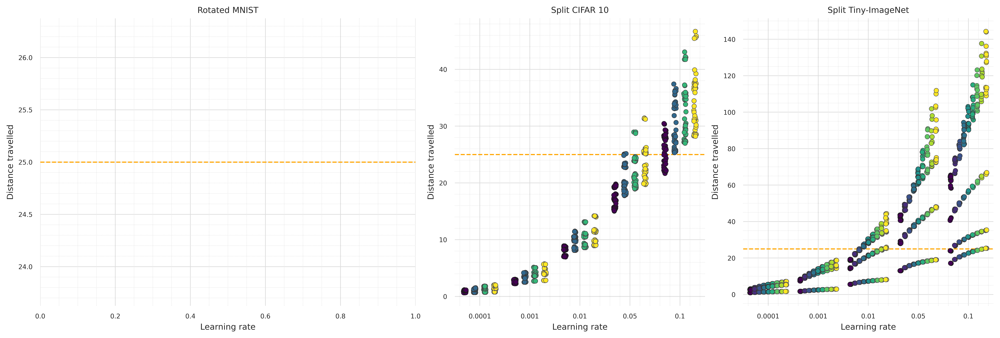

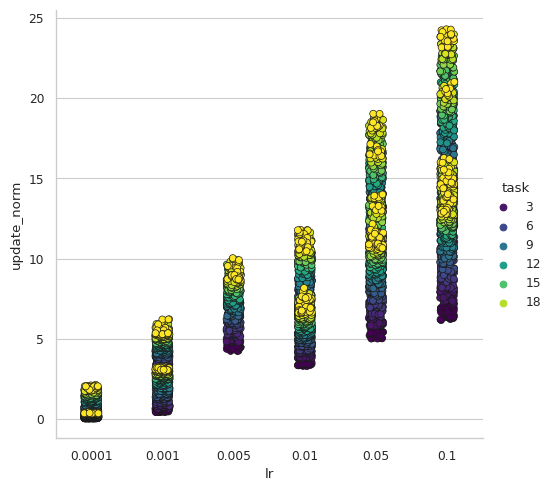

In [83]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,3, figsize=(15,5), sharey=False, width_ratios=[1.5,1,1],
                           sharex=False, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    

    _ax = ax[0]
    _df = all_rm_res_melted.loc[all_rm_res_melted['notes']!="testrun"] # excluding test runs
    _df = _df.loc[_df['update_norm']!=np.inf]
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>1]
    _df['low_lr'] = _df['lr'] <= 0.001
    _df = _df.loc[_df['lr']<=0.1]
    #_df = _df.loc[_df['ta']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)

    #_dfr = _df.loc[_df['model'].isin(['icarl','icarl_random'])] # excluding test runs
    sns.catplot(data=_df, x='lr', y="update_norm",hue='task', 
                 edgecolor="gray", linewidth=0.5, 
                  ax=_ax, palette="viridis")

    _ax.set_title('', fontsize=9)
    _ax.set_ylabel(r'', fontsize=10)
    _ax.set_xlabel(r'', fontsize=10)
    # AESTHETICS control 
    _ax.set_facecolor('white')
    [_ax.spines[side].set_visible(False) for side in _ax.spines]
    [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
    # major and minor grids
    _ax.grid(which='major', color='gainsboro', linewidth=0.7)
    _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    _ax.minorticks_on()
    _ax.tick_params('both', labelsize=7)

    _ax.set_ylabel(r'Distance travelled', fontsize=9)
    _ax.set_xlabel(r'Learning rate', fontsize=9)
    _ax.set_title(r'Rotated MNIST', fontsize=9)

    #ax.axhline(y=6, ls='--', color="orange")

    _ax.axhline(y=25, ls='--', color="orange")

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    h, l = _ax.get_legend_handles_labels()
    #_ax.get_legend().remove()
    
     # --------------------------------------------------------------------------
    

    _ax = ax[1]
    _df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
    _df = _df.loc[_df['update_norm']!=np.inf]
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>1]
    _df['low_lr'] = _df['lr'] <= 0.001
    #_df = _df.loc[_df['ta']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)

    #_dfr = _df.loc[_df['model'].isin(['icarl','icarl_random'])] # excluding test runs
    sns.stripplot(data=_df, x='lr', y="update_norm",hue='task', 
                  dodge=True, edgecolor="gray", linewidth=0.5, 
                  ax=_ax, orient='v', palette="viridis")

    _ax.set_title('', fontsize=9)
    _ax.set_ylabel(r'', fontsize=10)
    _ax.set_xlabel(r'', fontsize=10)
    # AESTHETICS control 
    _ax.set_facecolor('white')
    [_ax.spines[side].set_visible(False) for side in _ax.spines]
    [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
    # major and minor grids
    _ax.grid(which='major', color='gainsboro', linewidth=0.7)
    _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    _ax.minorticks_on()
    _ax.tick_params('both', labelsize=7)

    _ax.set_ylabel(r'Distance travelled', fontsize=9)
    _ax.set_xlabel(r'Learning rate', fontsize=9)
    _ax.set_title(r'Split CIFAR 10', fontsize=9)

    #ax.axhline(y=6, ls='--', color="orange")


    _ax.axhline(y=25, ls='--', color="orange")
    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    h, l = _ax.get_legend_handles_labels()
    _ax.get_legend().remove()

    # --------------------------------------------------------------------------
    

    _ax = ax[2]
    _df = all_timg_res_melted.loc[all_timg_res_melted['notes']!="testrun"] # excluding test runs
    _df = _df.loc[_df['update_norm']!=np.inf]
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>1]
    _df = _df.loc[_df['lr']!=0.005]
    _df['low_lr'] = _df['lr'] <= 0.001
    #_df = _df.loc[_df['ta']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)

    #_dfr = _df.loc[_df['model'].isin(['icarl','icarl_random'])] # excluding test runs
    sns.stripplot(data=_df, x='lr', y="update_norm",hue='task', 
                  dodge=True, edgecolor="gray", linewidth=0.5, 
                  ax=_ax, orient='v', palette="viridis")

    _ax.set_title('', fontsize=9)
    _ax.set_ylabel(r'', fontsize=10)
    _ax.set_xlabel(r'', fontsize=10)
    # AESTHETICS control 
    _ax.set_facecolor('white')
    [_ax.spines[side].set_visible(False) for side in _ax.spines]
    [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
    # major and minor grids
    _ax.grid(which='major', color='gainsboro', linewidth=0.7)
    _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    _ax.minorticks_on()
    _ax.tick_params('both', labelsize=7)

    _ax.set_ylabel(r'Distance travelled', fontsize=9)
    _ax.set_xlabel(r'Learning rate', fontsize=9)
    _ax.set_title(r'Split Tiny-ImageNet', fontsize=9)

    _ax.axhline(y=25, ls='--', color="orange")

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    h, l = _ax.get_legend_handles_labels()
    _ax.get_legend().remove()
    
    # --------------------------------------------------------------------------

    # lgd = fig.legend(h, ['1', '2', '3', '4' , '5'], ncols=5,
    #                   bbox_to_anchor=(0.9, -0.08), fontsize=9) 
    

    # fig.savefig('updatenorm.pdf',#bbox_extra_artists=(lgd,), 
    #             bbox_inches='tight')




In [87]:
all_rm_res_melted['model'].unique()

array(['sgd', 'agem', 'er', 'ewc_on', 'ogd', 'si'], dtype=object)

/tmp/ipykernel_2560920/1806714630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lr_cat']= df['lr'].astype('category')


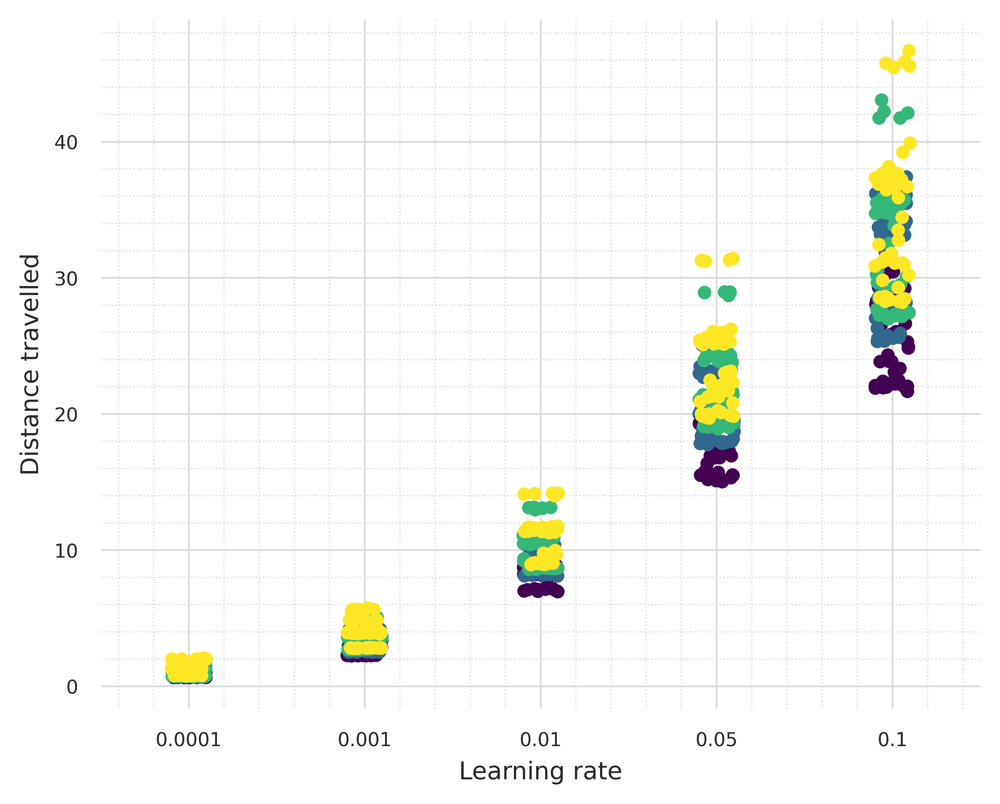

In [41]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(5,4), sharey=True, sharex=True, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    

    _df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>1]
    _df['low_lr'] = _df['lr'] <= 0.001
    #_df = _df.loc[_df['ta']<=25]
    _df = discretize_column(_df, 'update_norm', bins=10)

    #_dfr = _df.loc[_df['model'].isin(['icarl','icarl_random'])] # excluding test runs
    sns.stripplot(data=_df, x='lr', y="update_norm",hue='task', ax=ax, orient='v', palette="viridis")

    _ax = ax
    _ax.set_title('', fontsize=9)
    _ax.set_ylabel(r'', fontsize=10)
    _ax.set_xlabel(r'', fontsize=10)
    # AESTHETICS control 
    _ax.set_facecolor('white')
    [_ax.spines[side].set_visible(False) for side in _ax.spines]
    [_ax.spines[side].set_color('whitesmoke') for side in _ax.spines]
    # major and minor grids
    _ax.grid(which='major', color='gainsboro', linewidth=0.7)
    _ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    _ax.minorticks_on()
    _ax.tick_params('both', labelsize=7)

    ax.set_ylabel(r'Distance travelled', fontsize=9)
    ax.set_xlabel(r'Learning rate', fontsize=9)

    #ax.axhline(y=6, ls='--', color="orange")

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    
     # --------------------------------------------------------------------------
    h, l = ax.get_legend_handles_labels()
    ax.get_legend().remove()

    # lgd = fig.legend(h, ['1', '2', '3', '4' , '5'], ncols=5,
    #                   bbox_to_anchor=(0.9, -0.08), fontsize=9) 
    

    fig.savefig('updatenorm.pdf',#bbox_extra_artists=(lgd,), 
                bbox_inches='tight')




/tmp/ipykernel_2560920/1806714630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lr_cat']= df['lr'].astype('category')
/tmp/ipykernel_2560920/1416250299.py:61: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


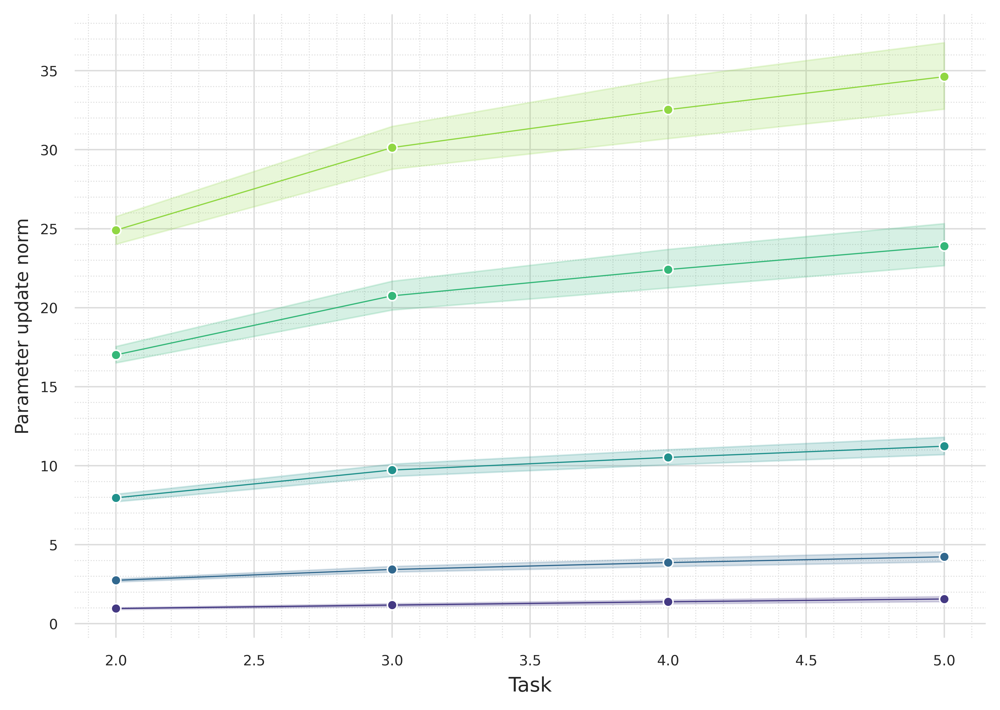

In [42]:
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,1, figsize=(7,5), sharey=False, dpi=800, constrained_layout=True)
    #colors = ['orange','royalblue','goldenrod','yellowgreen','lightseagreen']
    


    colors1=sns.color_palette('Blues', n_colors=8); 
    colors2=sns.color_palette('Reds', n_colors=8); 

    my_palette={'ogd':colors2[1], 
                'icarl':colors2[3],
                'ewc_on':colors2[5],
                'si':colors2[7],
                'er':colors1[4],
                'agem':colors1[7]}



    _df = all_c10_res_melted.loc[all_c10_res_melted['notes']!="testrun"] # excluding test runs
    _df = process_dataframe(_df)
    _df = _df.loc[_df['task']>1]
    _df = _df.loc[_df['update_norm']<=100]
    _df = discretize_column(_df, 'update_norm', bins=10)
    _df = _df.loc[_df['model'].isin(['icarl','ewc_on','si','er','agem'])]


    #_dfl = _df.loc[_df['model'].isin(['ogd','icarl','ewc_on','si'])]
    sns.lineplot(data=_df, x="task", y="update_norm", size=1,
                 markers=True, marker='o', hue="lr_cat",  palette="viridis",
                   ls='-',ax=ax)
    
    
    #ax.set_title(f"CIFAR100", fontsize=10, y=1.)
    ax.set_ylabel(r'Parameter update norm', fontsize=9)
    ax.set_xlabel(r'Task', fontsize=10, y=+1)
    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    [ax.spines[side].set_color('whitesmoke') for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.7)
    ax.grid(which='minor', color='gainsboro', linestyle=':', linewidth=0.5)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    ax.tick_params('both', labelsize=7)

    #ax.set_xlim(0.0, 20)
    #ax.set_yticks(range(10,80,15))
    #ax.set_yticklabels(str(i) for i in range(10,80,15))

    
     # --------------------------------------------------------------------------
    h, _ = ax.get_legend_handles_labels()
    ax.get_legend().remove()


    
    #sns.despine()
    plt.tight_layout()
